In [9]:
import pickle
from pathlib import Path
from datetime import date

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from dataclasses import dataclass
from typing import List, Dict, Any

import igraph as ig
from itertools import product
from collections import defaultdict

#sns.set(style="whitegrid")

### Dataclass (for unpickling)

In [2]:
@dataclass
class AllSimulationResults:
    initial_conditions: List[pd.DataFrame]      # [run]
    emotion_history: List[List[List[float]]]   # [run][t][agent]
    avg_emotions: List[List[float]]            # [run][t]
    interventions: List[List[int]]             # [run][t_intervention]
    rl_actions: List[List[int]]                # [run][t]
    rl_rewards: List[List[float]]              # [run][t]
    rl_quality: List[List[float]]              # [run][t]
    homophily_index: List[List[float]]        # [run][t]
    intimacy_history: List[List[np.ndarray]]  # [run][t] intimacyMatrix
    final_intimacy: List[np.ndarray]          # [run] final intimacyMatrix, though i guess it's redundant with the above
    absorption_history: List[List[Dict[tuple, float]]]  # [run][t][(i,j)] absorption from i to j
    sentiment_graphs: List[Any]               # [run] matplotlib figures
    meta: Dict[str, Any]

# 1. CONFIG
base_dir = r"R:\sescott1\Masters\523\Simulation\RL"  # adjust if needed
#base_dir = r"C:\Users\sarah\OneDrive\Documents\Masters\523\Emotion Contagion\Simulation Runs\RL"
#date_str = date.today().strftime("%m_%d_%Y")  # to get today's date in string form, otherwise specify desired date manually below
date_str = "01_11_2026"

team_sizes = [14, 50, 100]  # leader not included in team size here
network_structures = ["community", "core_periphery", "random"]
styles = ["No_Intervention", "High_Fully_Constrained", "Low_Fully_Constrained", "High_Initially_Constrained", "Low_Initially_Constrained", "Free"]  # ["High_Aperture", "Low_Aperture", "No_Intervention"]

style_pretty = {
    "High_Fully_Constrained": "High Fully",
    "High_Initially_Constrained": "High Initial",
    "Low_Fully_Constrained": "Low Fully",
    "Low_Initially_Constrained": "Low Initial",
    "Free": "Free",
    "No_Intervention": "None"
}

### Helper functions

In [3]:
def load_condition(base_dir, date_str, team_size, network_structure, style):
    """
    Load one condition (team_size, network_structure, style) - 54 conditions total
    from filepath where results (all_results.pkl) are stored
    """
    path = Path(base_dir) / date_str / f"team_size_{team_size+1}" / network_structure / style / "all_results.pkl"
    with open(path, "rb") as f:
        res = pickle.load(f)
    return res


def pad_runs(list_of_lists):
    """
    Take list of 1D lists (runs) and pad with np.nan to make a 2D array.
    Shape: (n_runs, max_T)
    """
    if len(list_of_lists) == 0:
        return np.empty((0, 0))
    max_T = max(len(x) for x in list_of_lists if len(x) > 0)
    arr = np.full((len(list_of_lists), max_T), np.nan)
    for i, seq in enumerate(list_of_lists):
        arr[i, :len(seq)] = seq
    return arr

### Load all 54 conditions

In [4]:
results = {}
for size in team_sizes:
    for net in network_structures:
        for sty in styles:
            results[(size, net, sty)] = load_condition(base_dir, date_str, size, net, sty)

# Intimacy Overview

In [1]:
# Heatmap of intimacy networks for each condition at beginning and end of simulation (side by side comparisons)

# Basic Network analysis

## Purpose: Examine size impact on network topology

## How: Metrics that account for size variation or normalize for scale? to prevent structural bias

### Metrics used:
- Density (edge-centric): how connected networks are
- Avg degree (node-centric): how connected nodes are
- Avg shortest path length: how many edges needed to traverse a network (e.g. for contagion to spread)
- Clustering coefficient (Fagiolo 2006's extension): how clustered agents tend to be (in terms of creating clusters/connections of three)
- Degree Gini coefficient?: inequality in degree distribution
- Largest connected component: how broken up networks are
- Modularity
- Centrality: Betweenness or Degree

In [6]:
def emotion_variance(avg_emotions):
    return np.nanmean([np.var(run) for run in avg_emotions])

def time_to_convergence(avg_emotions, eps=1e-3, window=10):
    times = []
    for run in avg_emotions:
        run = np.asarray(run)
        t_conv = np.nan
        for t in range(len(run) - window):
            if np.all(np.abs(np.diff(run[t:t+window])) < eps):
                t_conv = t
                break
        times.append(t_conv)
    return np.nanmean(times)

def network_metrics_from_intimacy(mat):
    mat = np.array(mat, copy=True)

    g = ig.Graph.Weighted_Adjacency(
        mat.tolist(),
        mode="directed",
        attr="weight",
        loops=False
    )

    metrics = {}
    metrics["Density"] = g.density(loops=False)

    try:
        metrics["Avg_Path_Length"] = g.average_path_length(weights="weight")
    except:
        metrics["Avg_Path_Length"] = np.nan

    metrics["Avg_Weighted_OutDegree"] = np.mean(
        g.strength(mode="out", weights="weight")
    )

    try:
        metrics["Clustering"] = np.mean(
            g.transitivity_local_directed(mode="zero")
        )
    except:
        metrics["Clustering"] = np.nan

    return metrics

In [10]:
rows = []
for (team_size, network, style), all_results in results.items():

    var_emotion = emotion_variance(all_results.avg_emotions)
    t_conv = time_to_convergence(all_results.avg_emotions)

    net_metrics = [
        network_metrics_from_intimacy(run_history[-1])
        for run_history in all_results.intimacy_history
    ]

    net_mean = pd.DataFrame(net_metrics).mean()

    rows.append({
        "Team_Size": team_size,
        "Network": network,
        "Style": style,
        "Emotion_Variance": var_emotion,
        "Time_to_Convergence": t_conv,
        **net_mean.to_dict()
    })

summary_df = pd.DataFrame(rows)
display(summary_df.round(4))


C:\Users\sescott1\AppData\Local\Temp\ipykernel_31516\3494226819.py:14: RuntimeWarning: Mean of empty slice
  return np.nanmean(times)


,Team_Size,Network,Style,Emotion_Variance,Time_to_Convergence,Density,Avg_Path_Length,Avg_Weighted_OutDegree,Clustering
0,14,community,No_Intervention,0.0089,87.4615,1.0,0.0626,0.9988,NaN
1,14,community,High_Fully_Constrained,0.0060,104.0000,1.0,0.0564,0.9988,NaN
2,14,community,Low_Fully_Constrained,0.0080,86.3333,1.0,0.0618,0.9988,NaN
3,14,community,High_Initially_Constrained,0.0274,104.0000,1.0,0.0566,0.9988,NaN
4,14,community,Low_Initially_Constrained,0.0074,86.3333,1.0,0.0593,0.9988,NaN
5,14,community,Free,0.0306,229.0000,1.0,0.0694,0.9989,NaN
6,14,core_periphery,No_Intervention,0.0086,88.3846,1.0,0.0626,0.9988,NaN
7,14,core_periphery,High_Fully_Constrained,0.0055,96.5000,1.0,0.0585,0.9988,NaN
8,14,core_periphery,Low_Fully_Constrained,0.0077,85.2222,1.0,0.0609,0.9988,NaN
9,14,core_periphery,High_Initially_Constrained,0.0417,80.0000,1.0,0.0585,0.9988,NaN


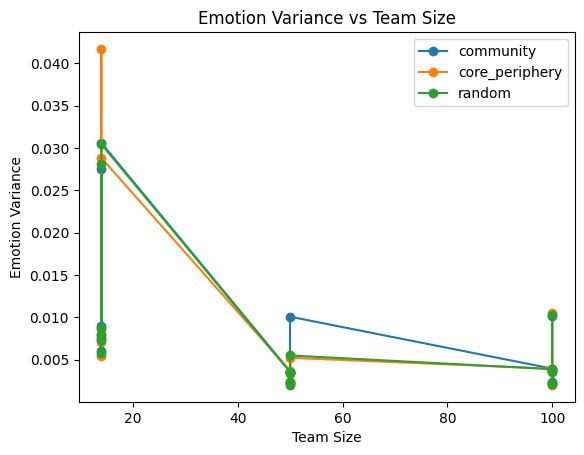

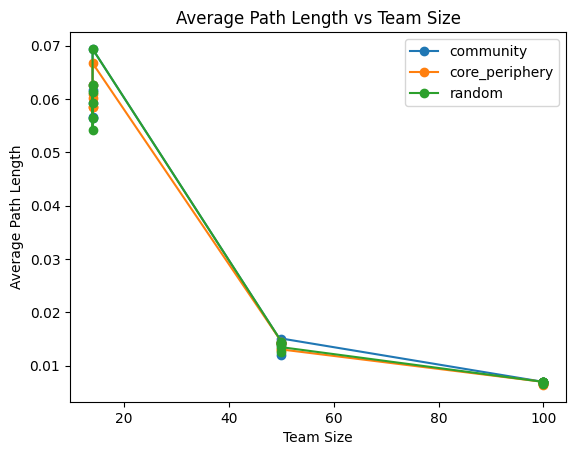

In [11]:
plt.figure()
for net in summary_df["Network"].unique():
    sub = summary_df[summary_df["Network"] == net]
    plt.plot(sub["Team_Size"], sub["Emotion_Variance"], marker="o", label=net)

plt.xlabel("Team Size")
plt.ylabel("Emotion Variance")
plt.title("Emotion Variance vs Team Size")
plt.legend()
plt.show()

plt.figure()
for net in summary_df["Network"].unique():
    sub = summary_df[summary_df["Network"] == net]
    plt.plot(sub["Team_Size"], sub["Avg_Path_Length"], marker="o", label=net)

plt.xlabel("Team Size")
plt.ylabel("Average Path Length")
plt.title("Average Path Length vs Team Size")
plt.legend()
plt.show()

In [9]:
def compute_metrics(I):
    """
    Compute weighted, directed metrics for a single adjacency matrix I.
    Returns a dict of metrics.
    """
    G = nx.from_numpy_array(I, create_using=nx.DiGraph)
    N = G.number_of_nodes()
    
    # Weighted density (sum of weights / max possible edges)
    weighted_edges_sum = sum(d['weight'] for _,_,d in G.edges(data=True))
    max_edges_sum = N * (N-1)
    density = weighted_edges_sum / max_edges_sum if max_edges_sum != 0 else np.nan
    
    # Average in/out strength
    in_strengths = np.array([d for _,d in G.in_degree(weight='weight')])
    out_strengths = np.array([d for _,d in G.out_degree(weight='weight')])
    avg_in_strength = np.mean(in_strengths)
    avg_out_strength = np.mean(out_strengths)
    
    # Weighted shortest paths (distance = 1/weight)
    dist_G = G.copy()
    for u,v,d in dist_G.edges(data=True):
        d['weight'] = 1.0 / d['weight'] if d['weight'] != 0 else np.inf
    
    try:
        lengths = dict(nx.all_pairs_dijkstra_path_length(dist_G, weight='weight'))
        all_lengths = [lengths[u][v] for u in lengths for v in lengths[u] if u != v and np.isfinite(lengths[u][v])]
        avg_shortest_path = np.mean(all_lengths) if all_lengths else np.nan
    except:
        avg_shortest_path = np.nan
    
    # Weighted clustering coefficient (undirected approximation)
    try:
        clustering_dict = nx.clustering(G.to_undirected(), weight='weight')
        avg_clustering = np.mean(list(clustering_dict.values()))
    except:
        avg_clustering = np.nan
    
    # In-strength Gini coefficient
    sorted_in = np.sort(in_strengths)
    n = len(sorted_in)
    cumulative = np.cumsum(sorted_in)
    gini = (n + 1 - 2 * np.sum(cumulative)/cumulative[-1]) / n if cumulative[-1] != 0 else 0.0
    
    # Weakly connected component fraction
    try:
        largest_cc = max(nx.weakly_connected_components(G), key=len)
        lcc_fraction = len(largest_cc) / N
    except:
        lcc_fraction = np.nan
    
    return {
        "density": density,
        "avg_in_strength": avg_in_strength,
        "avg_out_strength": avg_out_strength,
        "avg_shortest_path": avg_shortest_path,
        "avg_clustering": avg_clustering,
        "in_strength_gini": gini,
        "lcc_fraction": lcc_fraction
    }

# -------------------------------
# Build per-run metrics DataFrame
# -------------------------------
rows = []

for size, net, sty in product(team_sizes, network_structures, styles):
    sim_results = results[(size, net, sty)]
    runs_in_condition = len(sim_results.intimacy_history)  # auto-detect number of runs
    
    for run in range(runs_in_condition):
        I_last = sim_results.intimacy_history[run][-1]  # last timestep
        metrics = compute_metrics(I_last)
        row = {
            "team_size": size,
            "network": net,
            "style": sty,
            "run": run
        }
        row.update(metrics)
        rows.append(row)

# Convert to DataFrame
df_metrics = pd.DataFrame(rows)

# -------------------------------
# Aggregate: mean ± SD per condition
# -------------------------------
summary = df_metrics.groupby(["team_size", "network", "style"]).agg(
    density_mean=("density", "mean"),
    density_sd=("density", "std"),
    avg_in_strength_mean=("avg_in_strength", "mean"),
    avg_in_strength_sd=("avg_in_strength", "std"),
    avg_out_strength_mean=("avg_out_strength", "mean"),
    avg_out_strength_sd=("avg_out_strength", "std"),
    avg_shortest_path_mean=("avg_shortest_path", "mean"),
    avg_shortest_path_sd=("avg_shortest_path", "std"),
    avg_clustering_mean=("avg_clustering", "mean"),
    avg_clustering_sd=("avg_clustering", "std"),
    in_strength_gini_mean=("in_strength_gini", "mean"),
    in_strength_gini_sd=("in_strength_gini", "std"),
    lcc_fraction_mean=("lcc_fraction", "mean"),
    lcc_fraction_sd=("lcc_fraction", "std")
).reset_index()

# -------------------------------
# Example: inspect results
# -------------------------------
print(df_metrics.head())      # per-run, flexible for pivoting / plotting
print(summary.head())         # mean ± SD per condition


   team_size    network            style  run   density  avg_in_strength  \
0         14  community  No_Intervention    0  0.076923              1.0   
1         14  community  No_Intervention    1  0.076923              1.0   
2         14  community  No_Intervention    2  0.076923              1.0   
3         14  community  No_Intervention    3  0.076923              1.0   
4         14  community  No_Intervention    4  0.076923              1.0   

   avg_out_strength  avg_shortest_path  avg_clustering  in_strength_gini  \
0               1.0          14.902096        0.536923          0.066417   
1               1.0          20.397850        0.343539          0.044709   
2               1.0          15.418841        0.457224          0.052913   
3               1.0          15.991393        0.437021          0.052325   
4               1.0          15.417517        0.536599          0.059455   

   lcc_fraction  
0           1.0  
1           1.0  
2           1.0  
3           1.

Showing sentiment graphs for No_Intervention


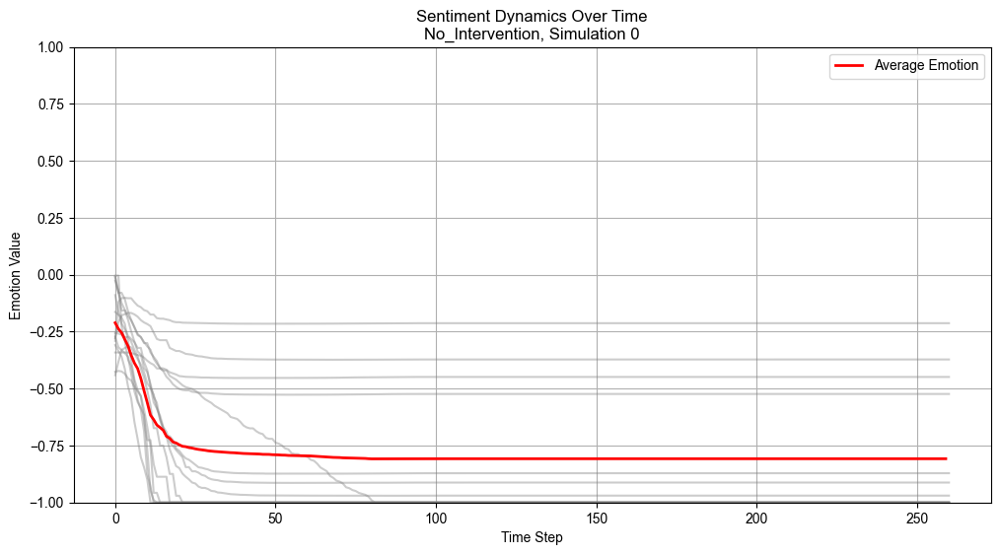

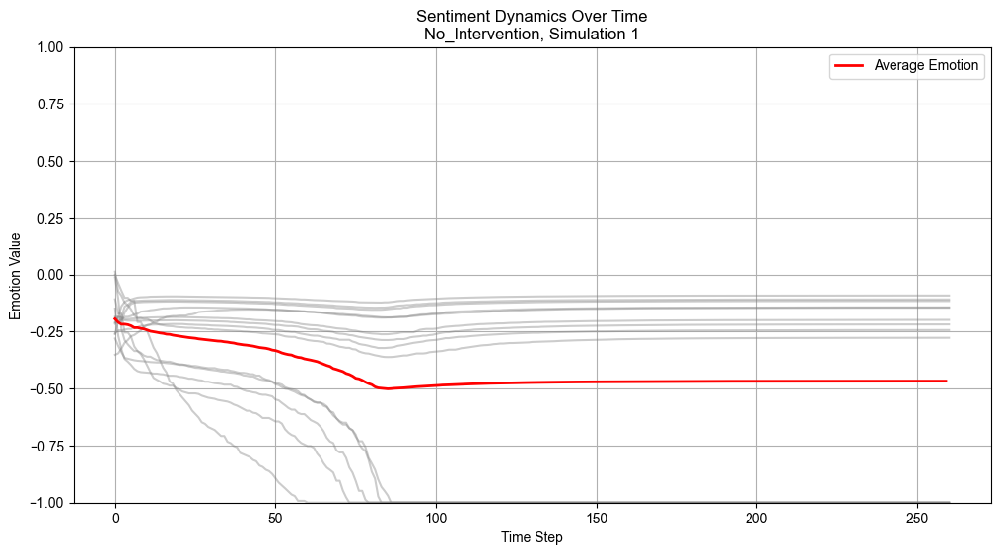

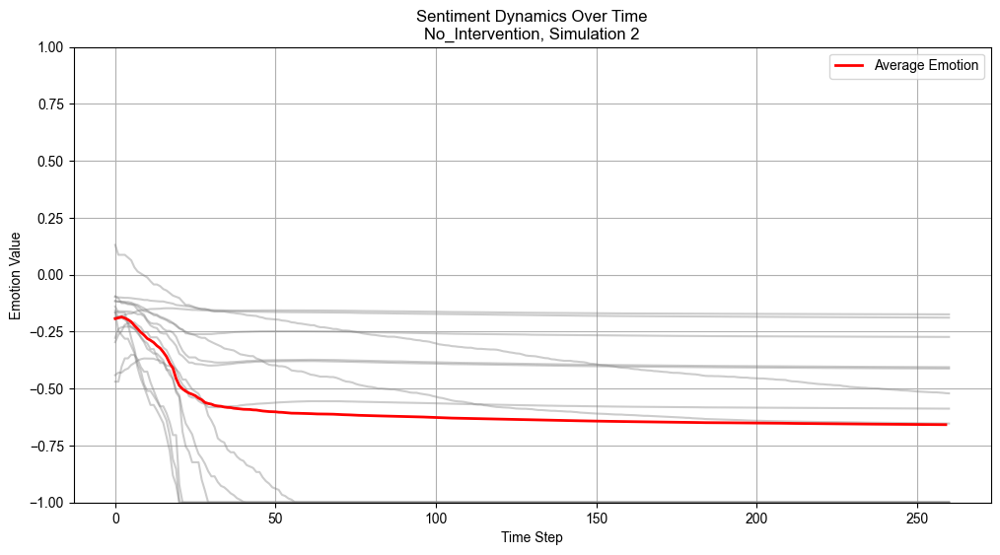

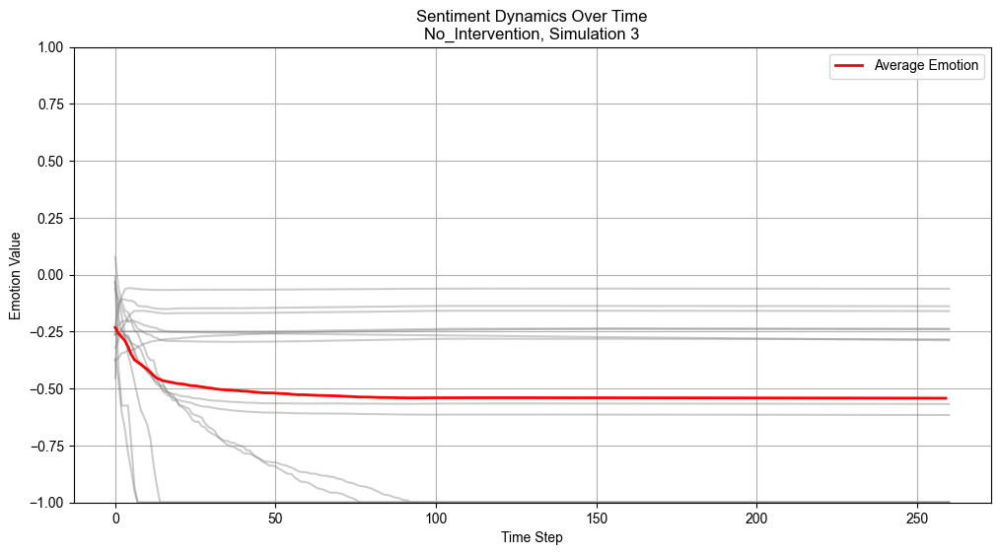

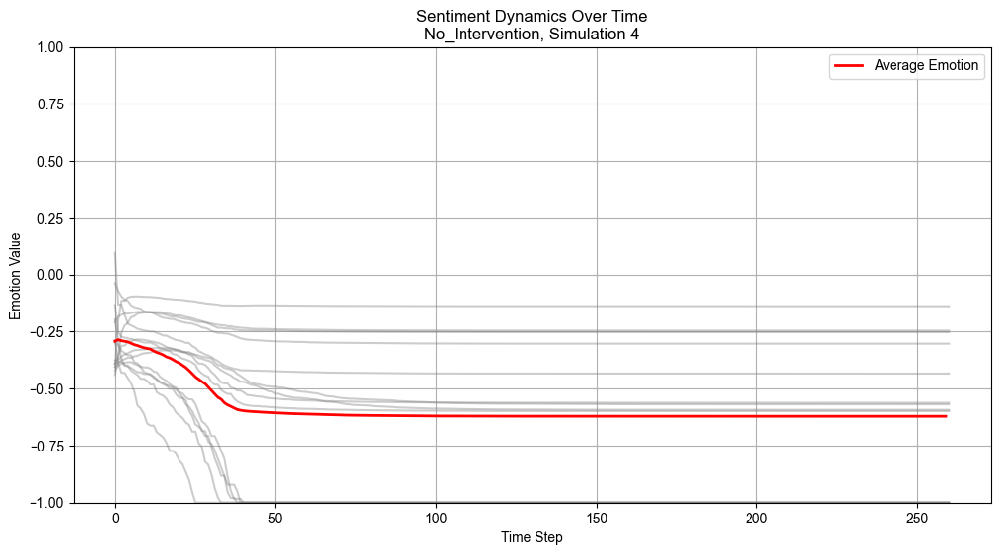

...

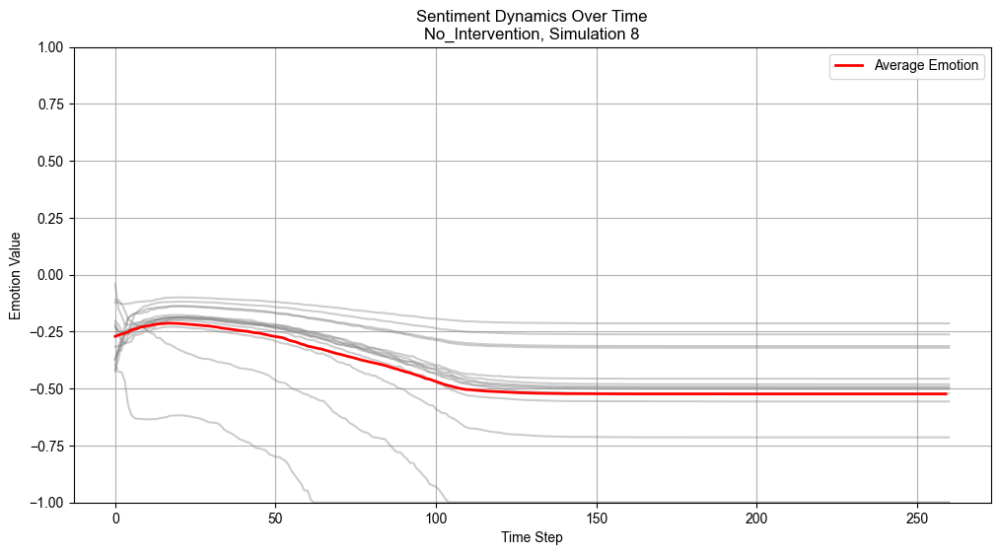

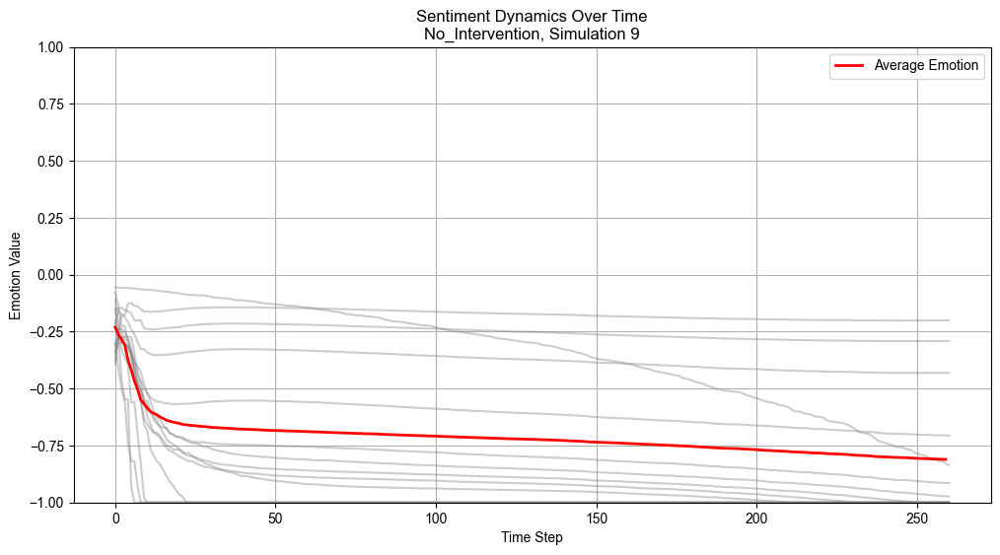

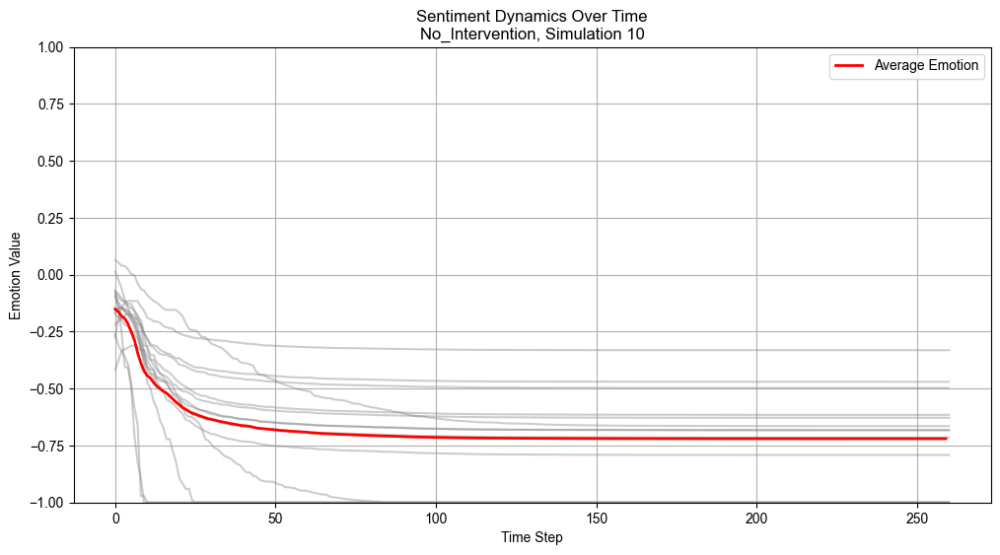

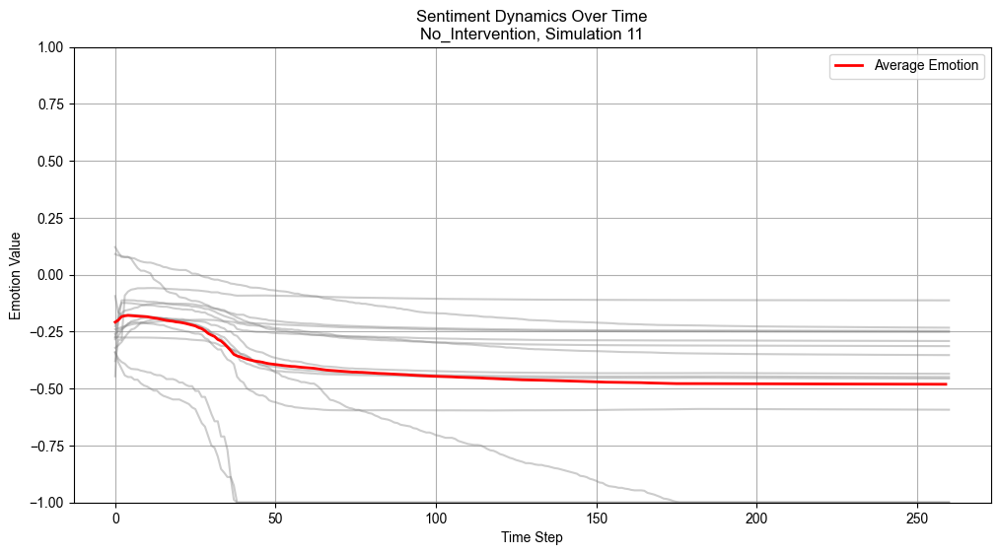

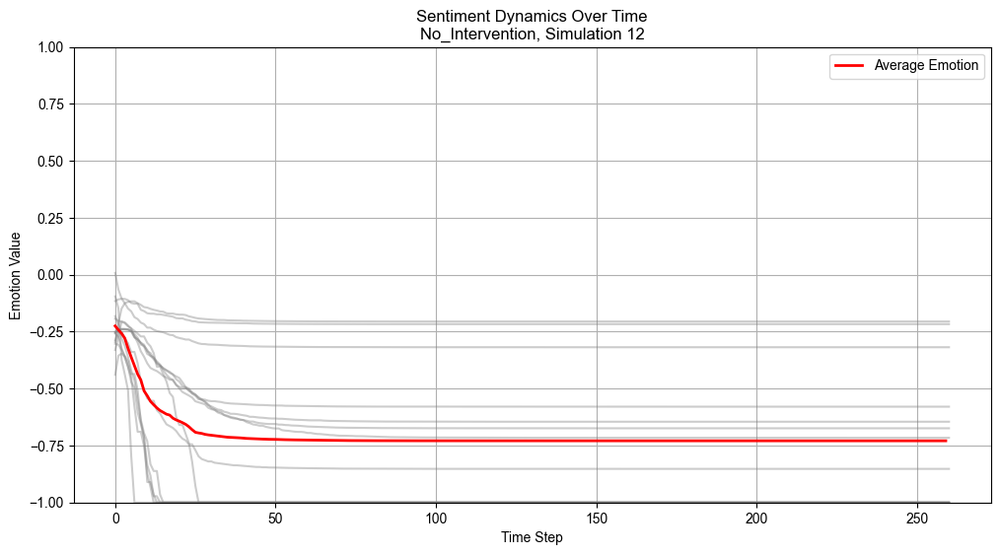

Showing sentiment graphs for High_Fully_Constrained


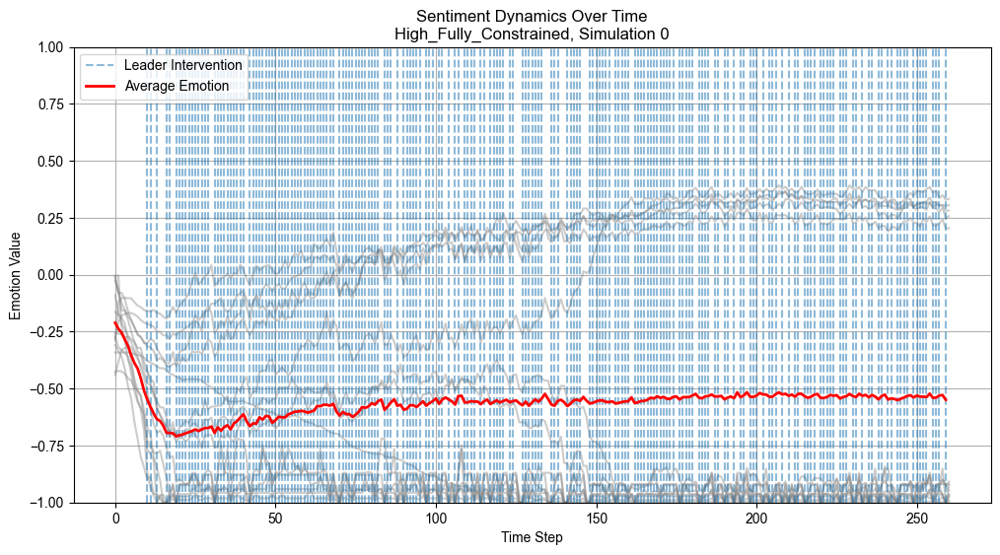

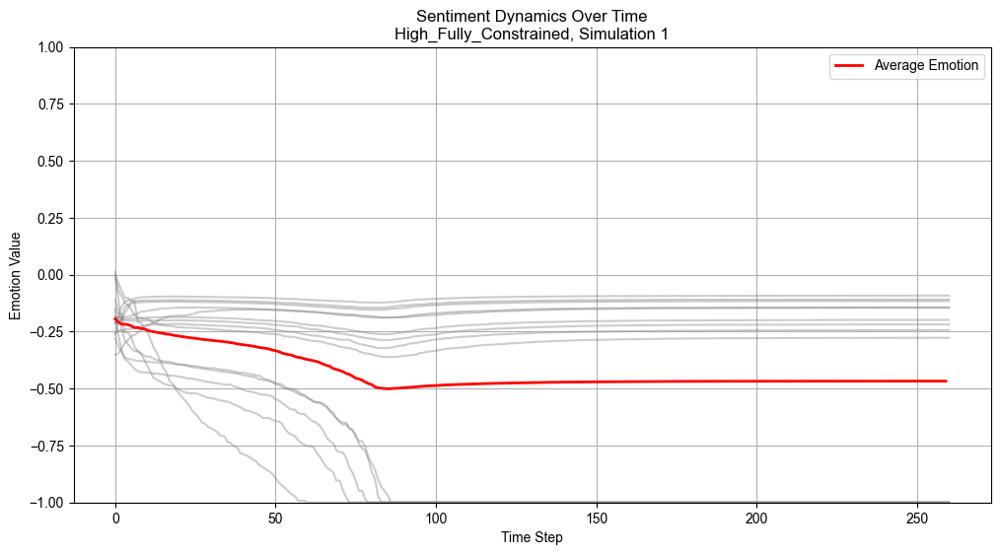

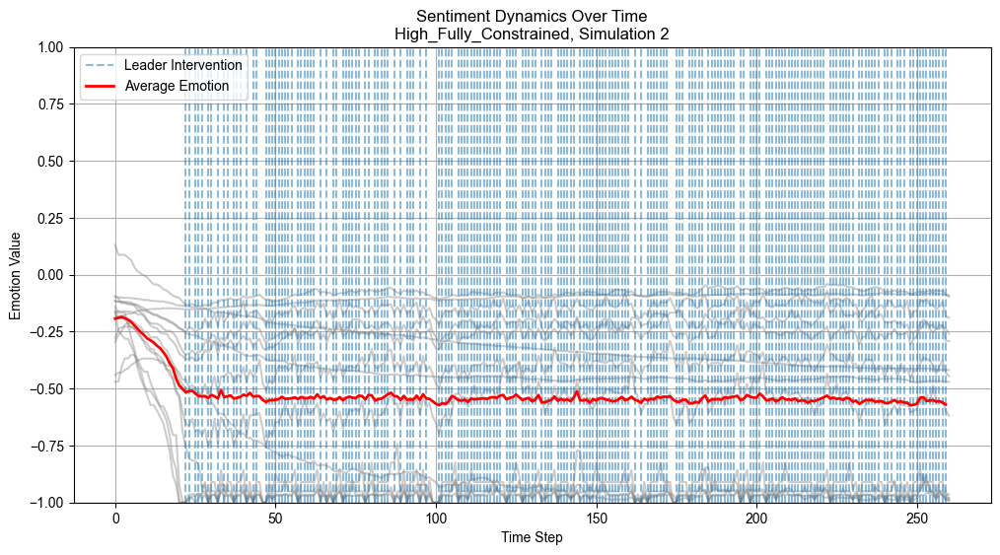

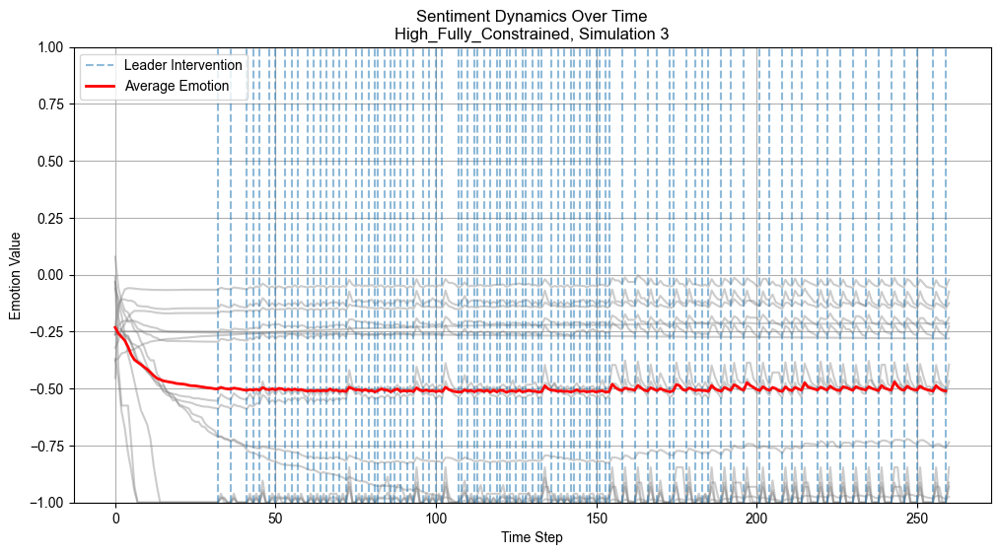

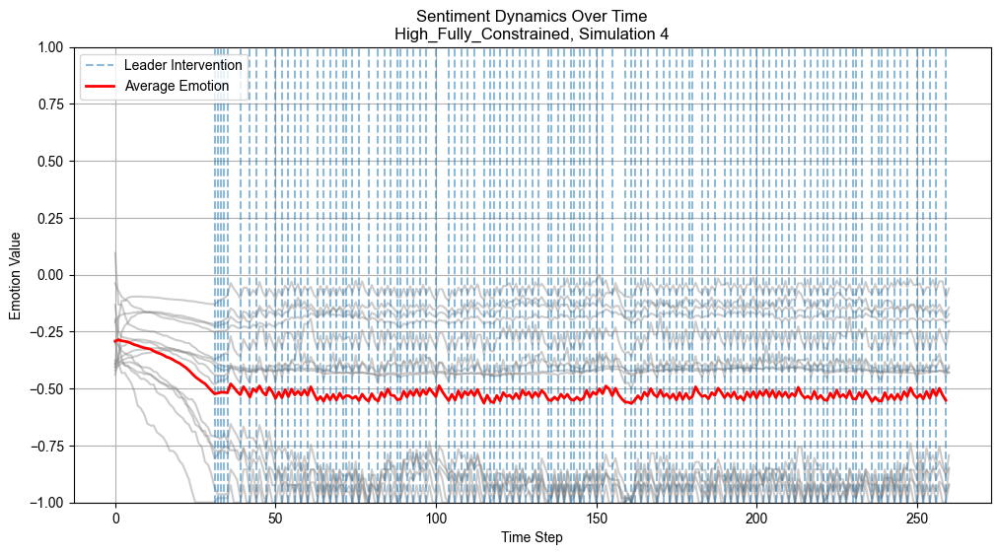

...

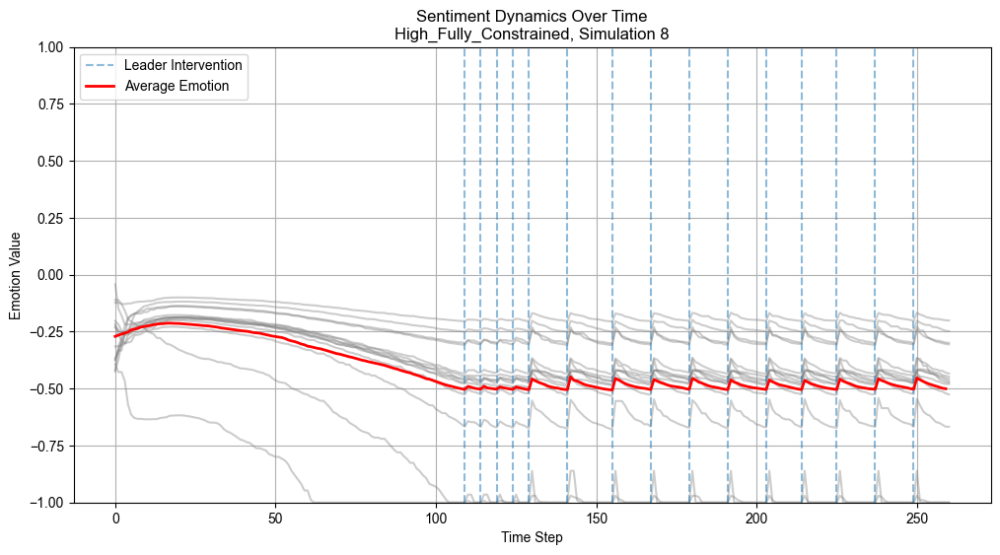

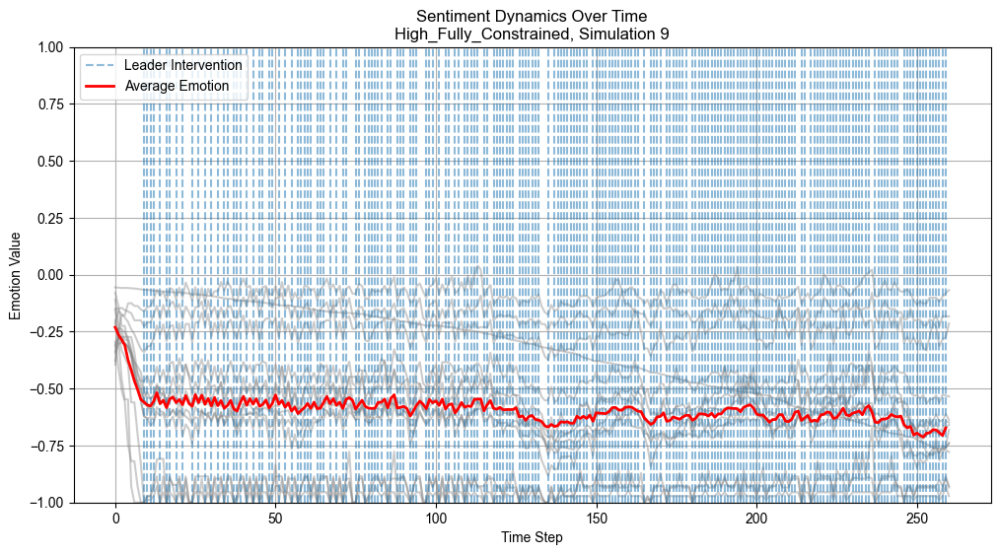

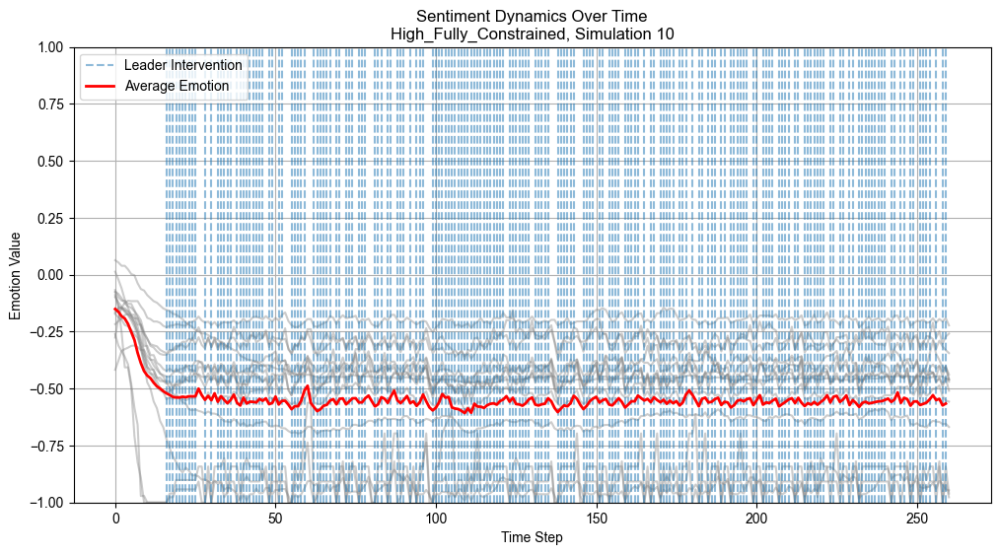

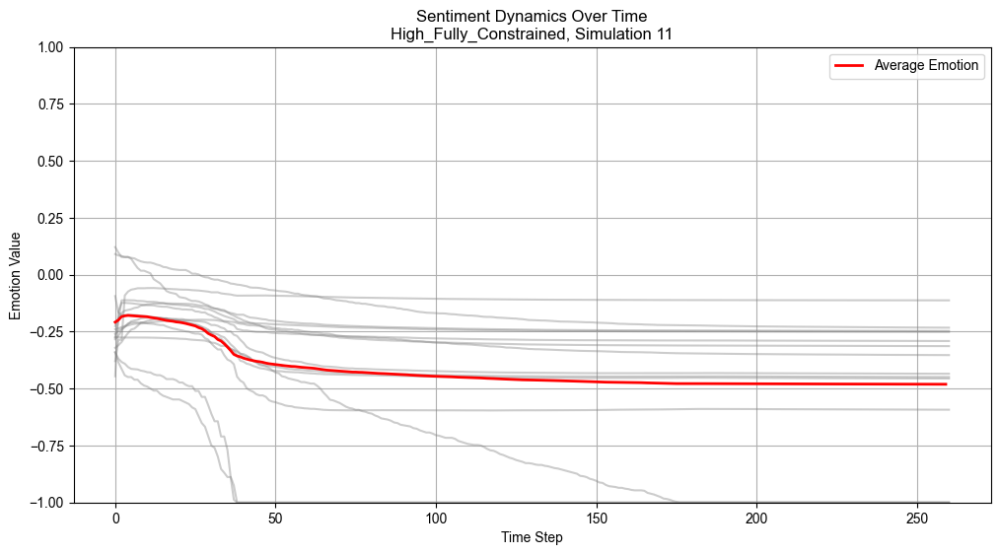

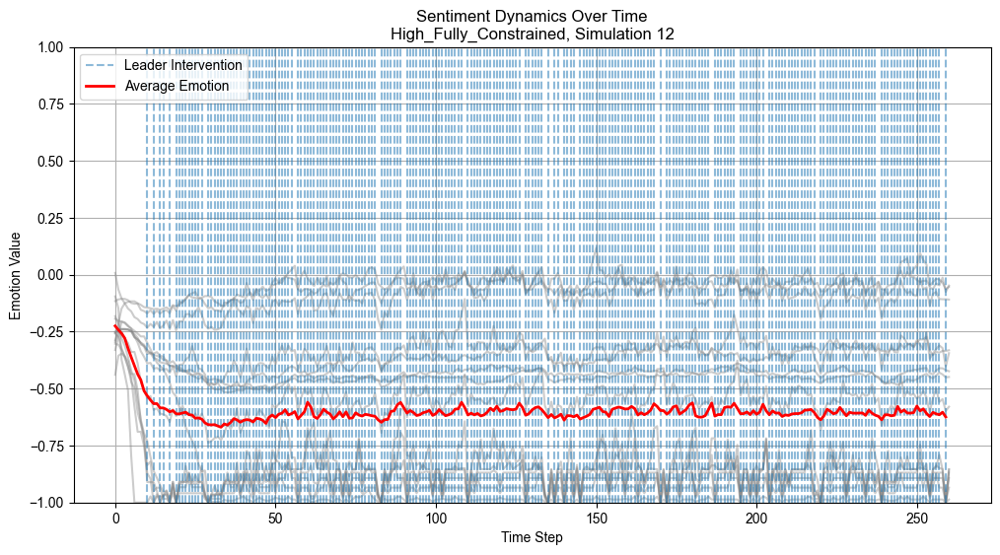

Showing sentiment graphs for Low_Fully_Constrained


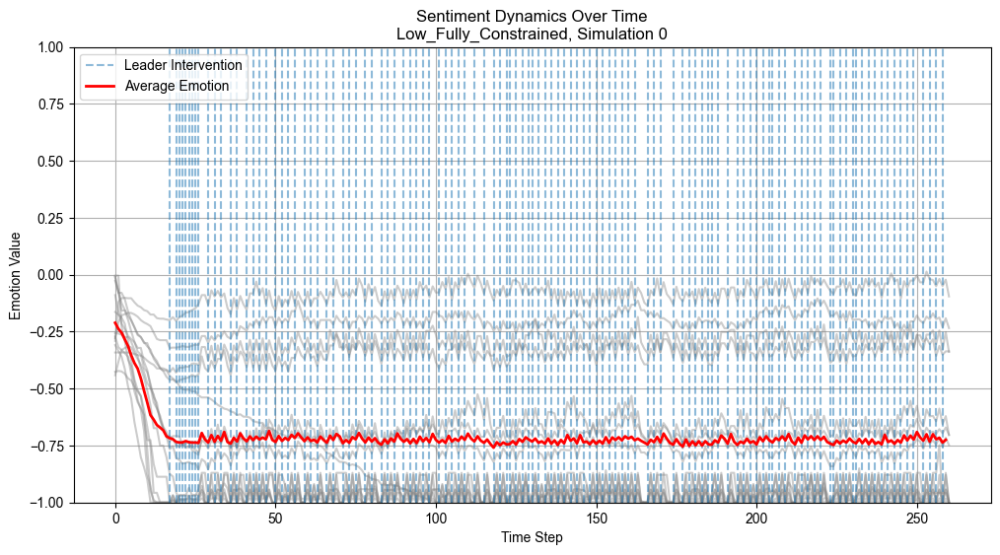

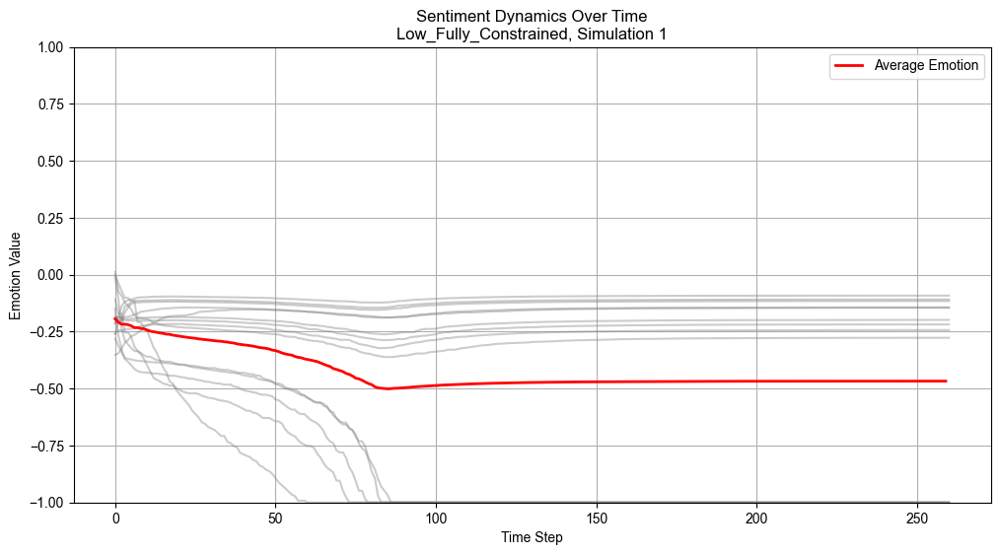

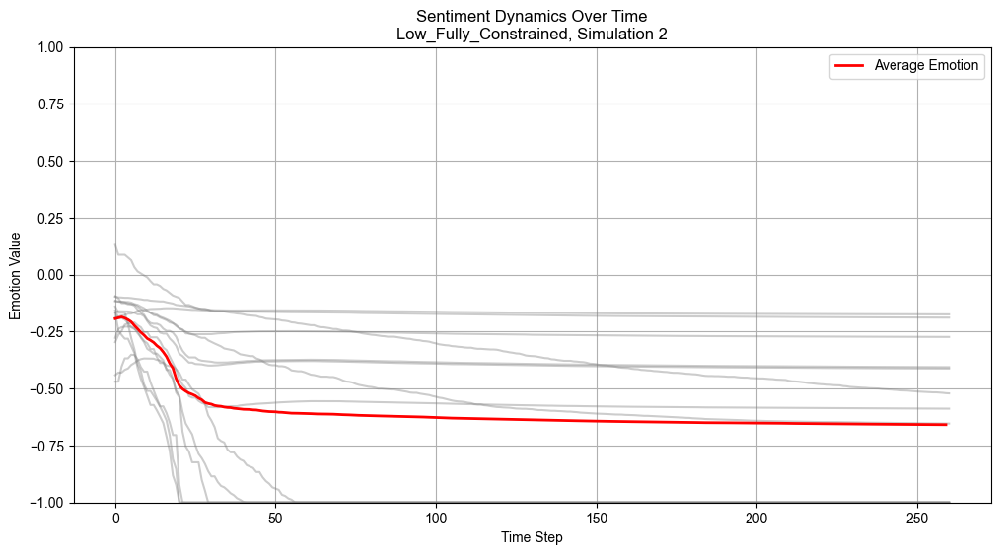

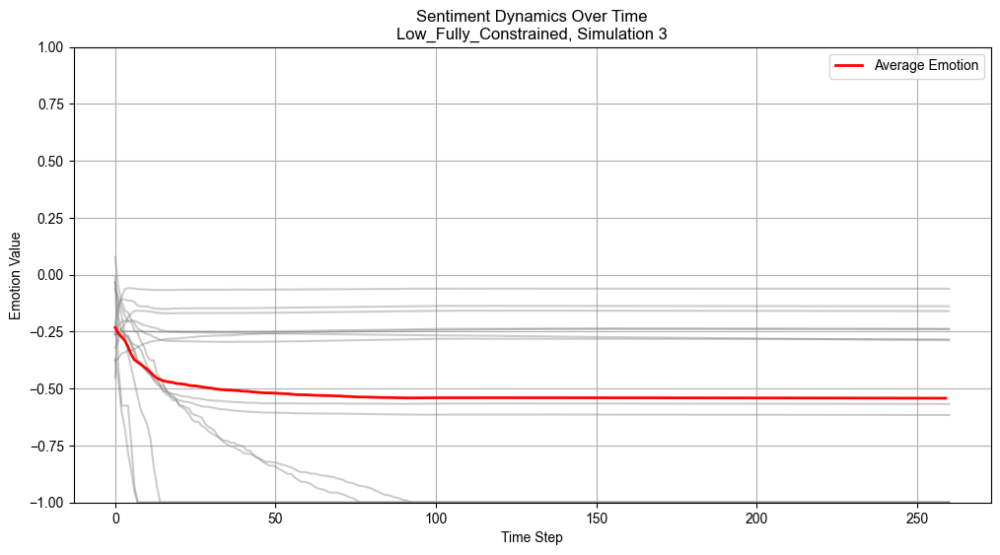

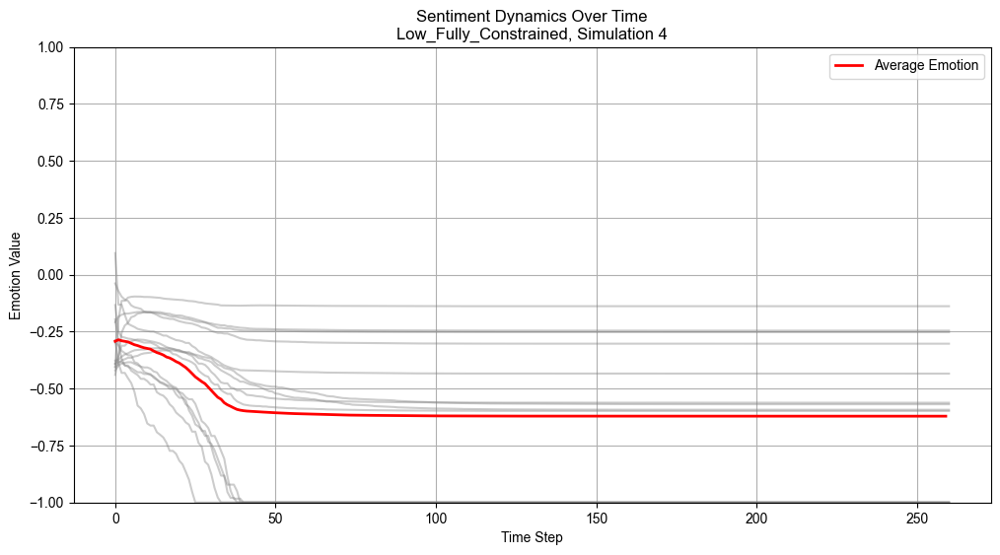

...

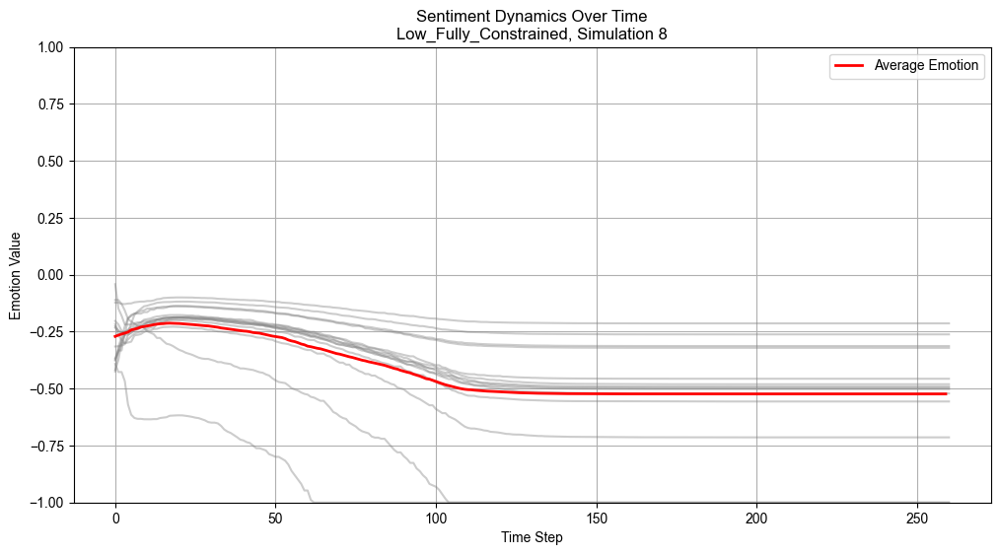

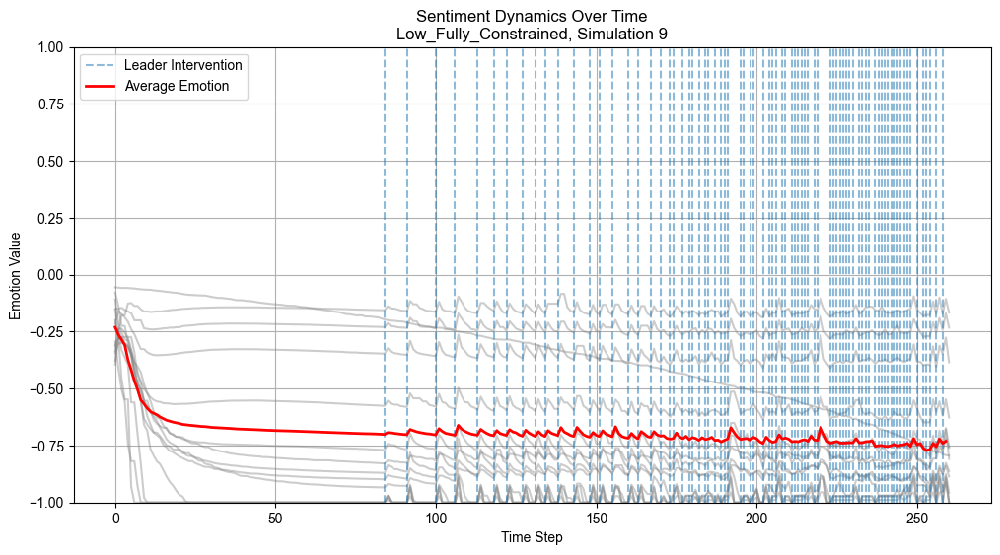

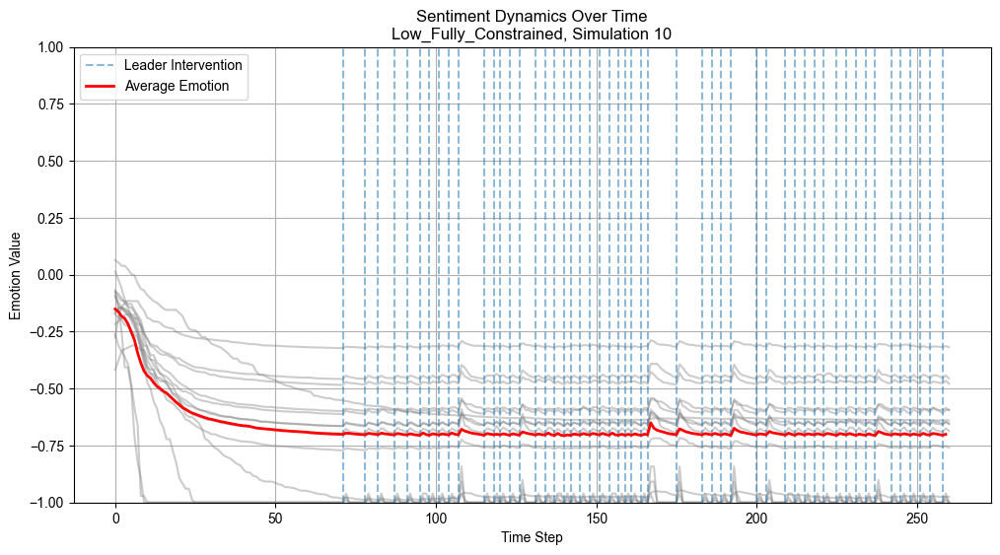

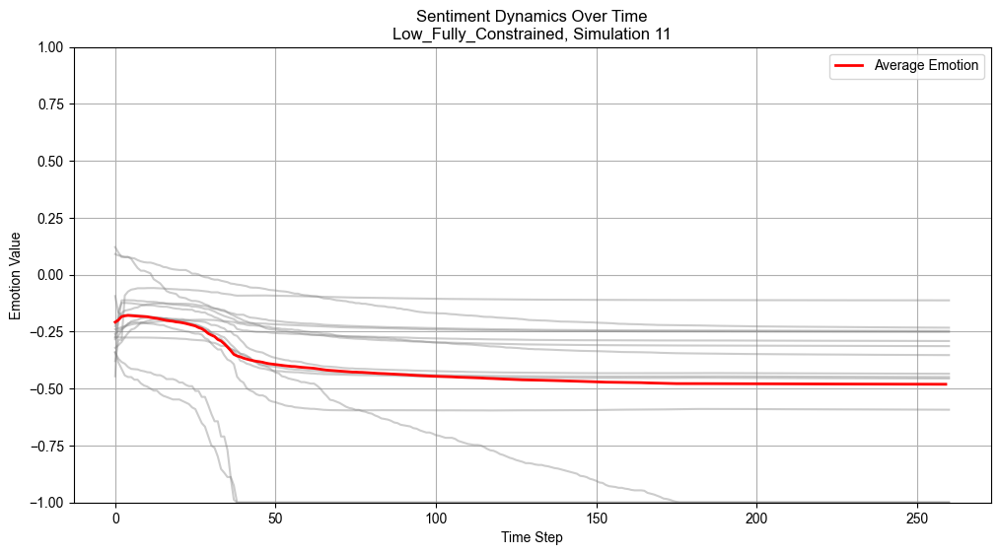

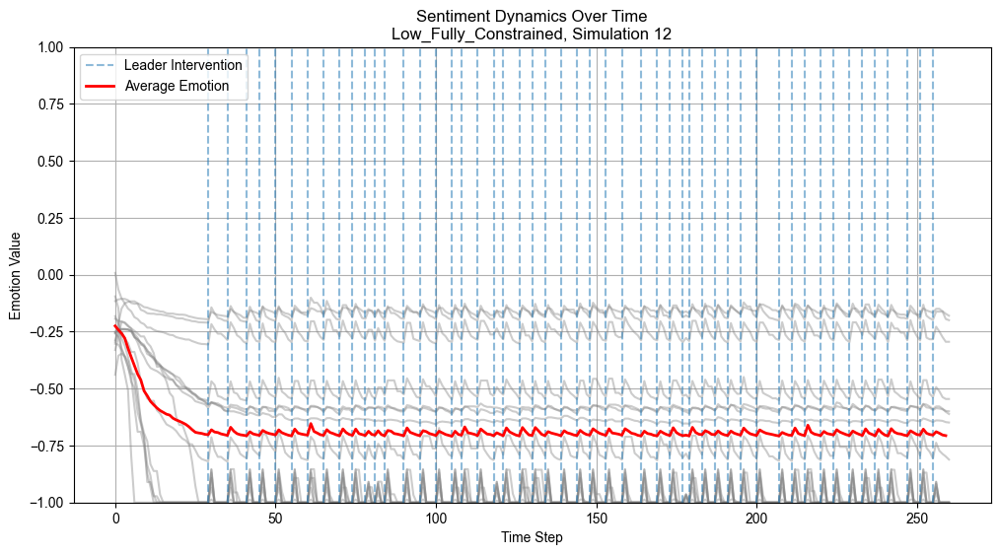

Showing sentiment graphs for High_Initially_Constrained


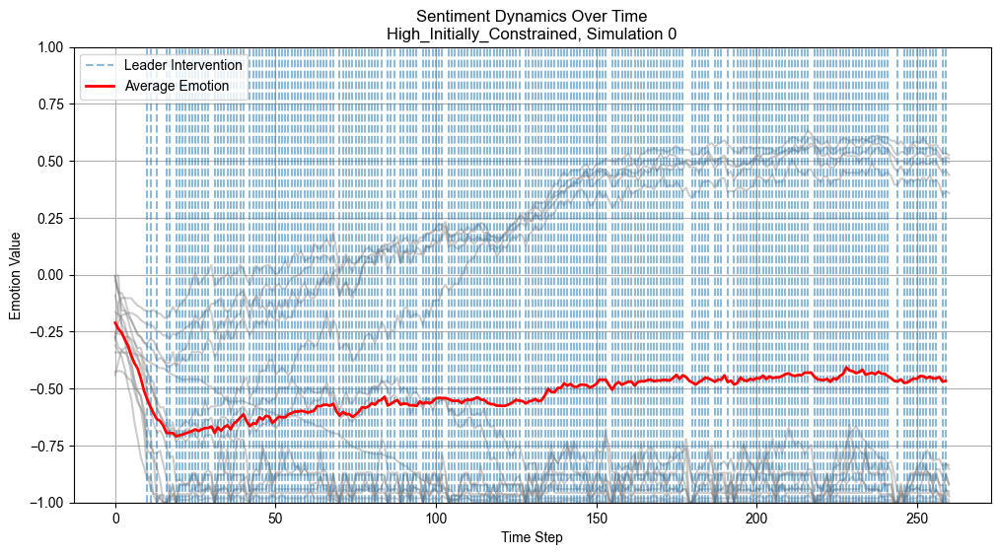

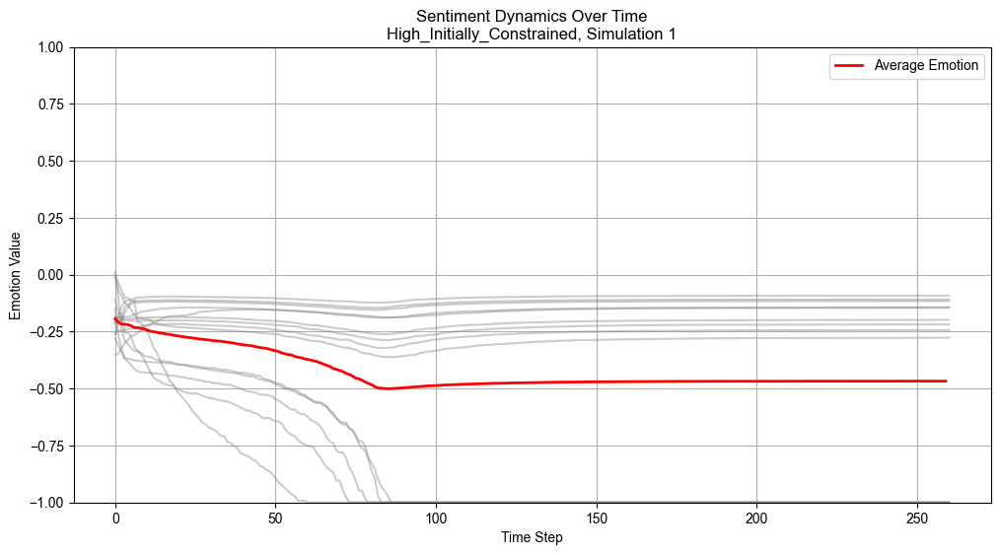

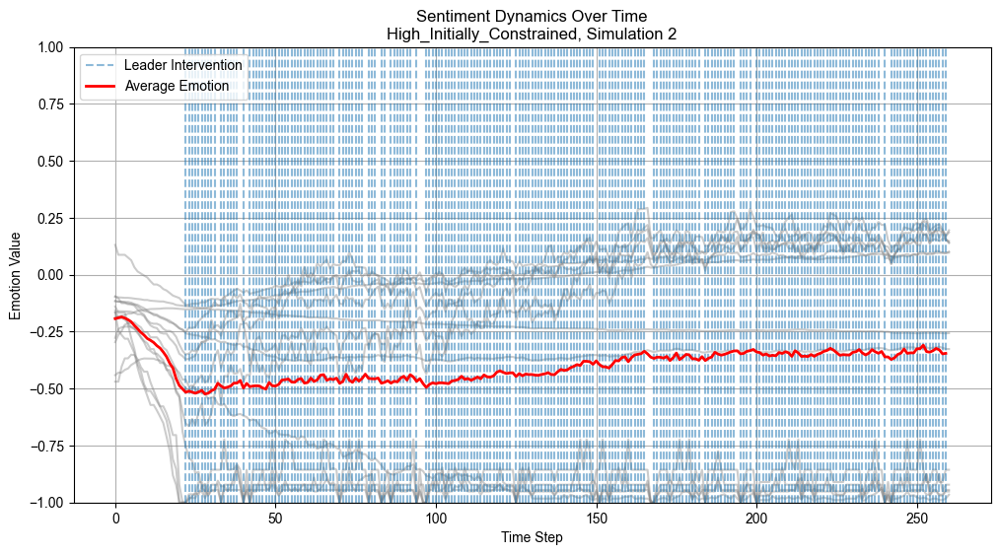

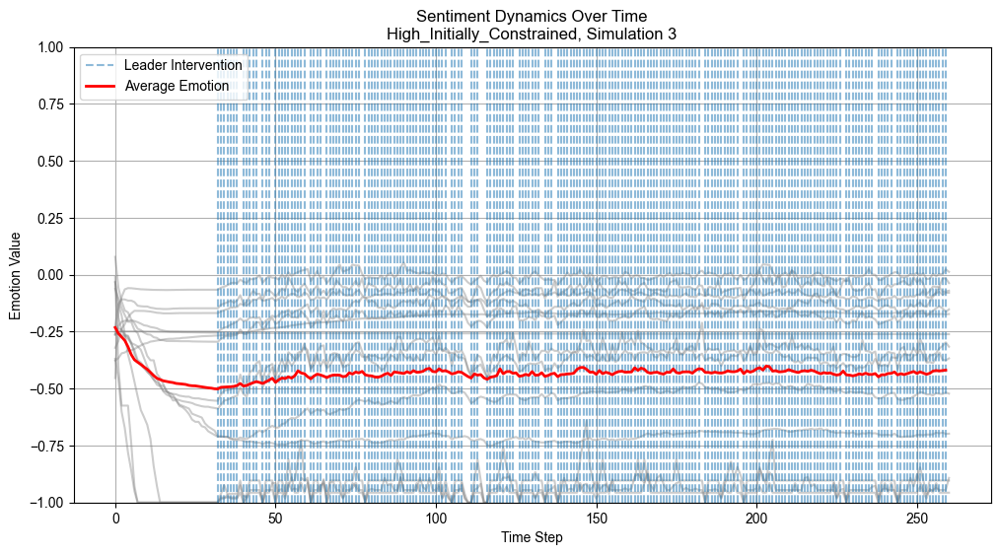

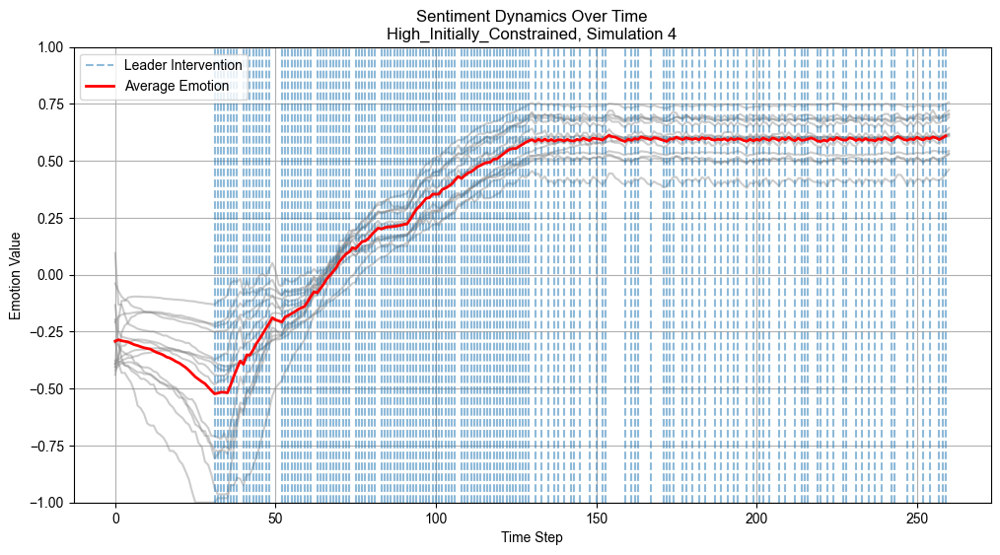

...

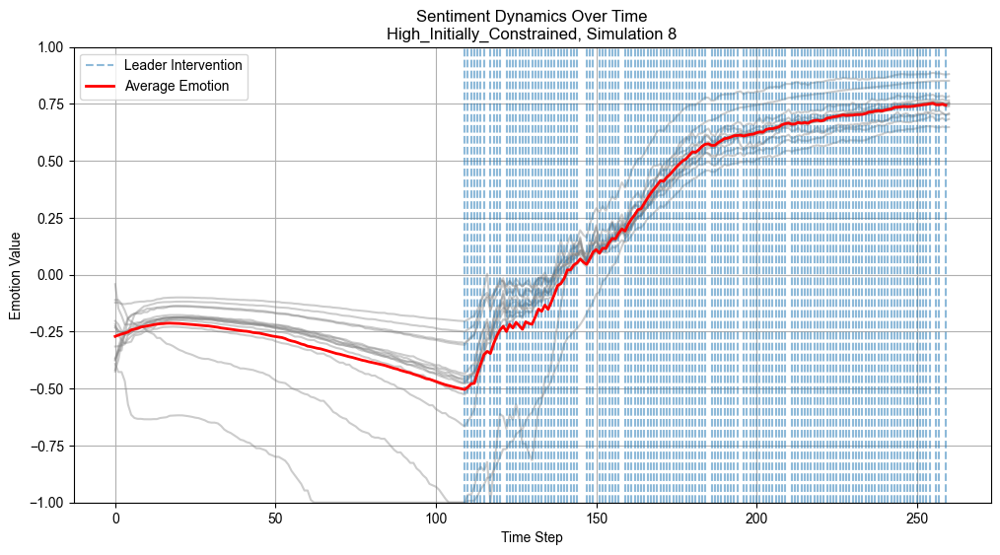

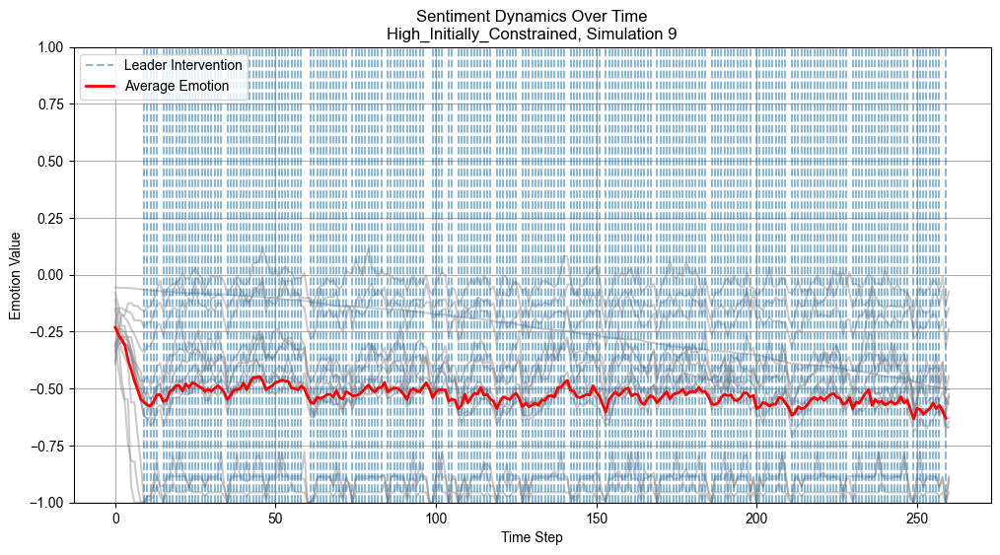

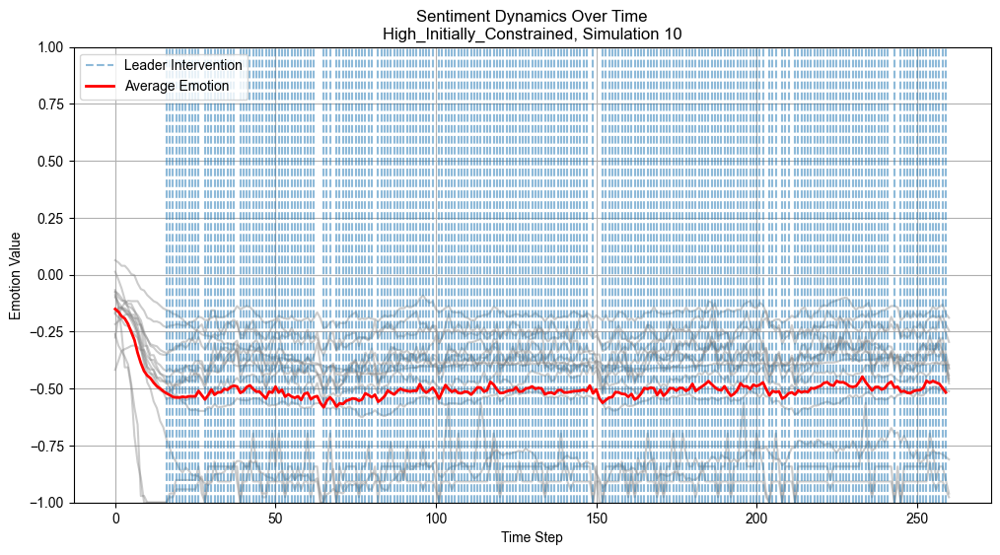

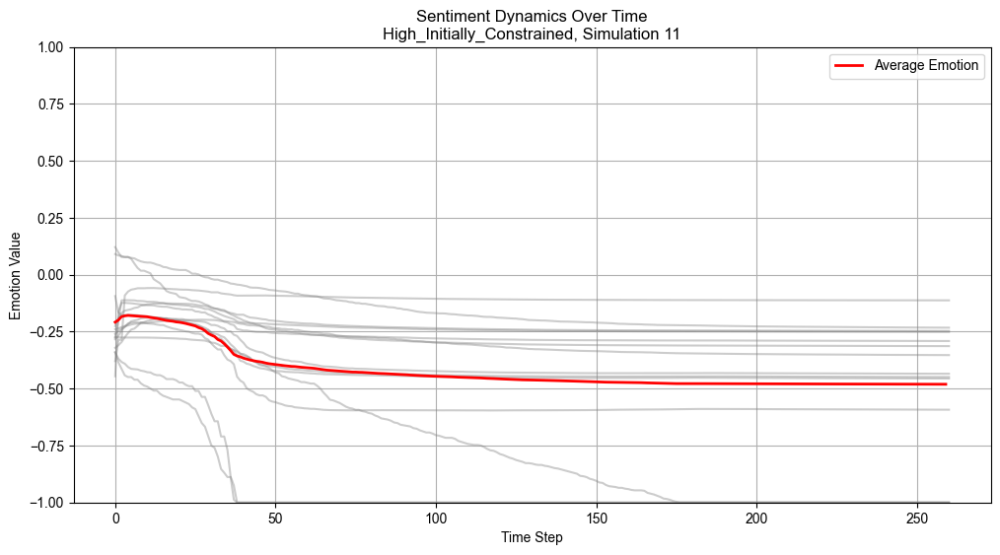

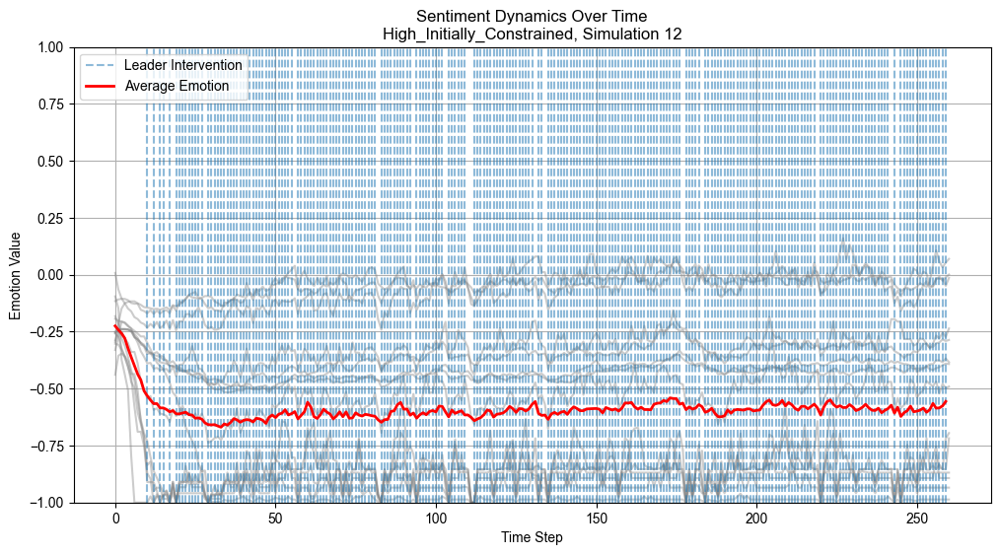

Showing sentiment graphs for Low_Initially_Constrained


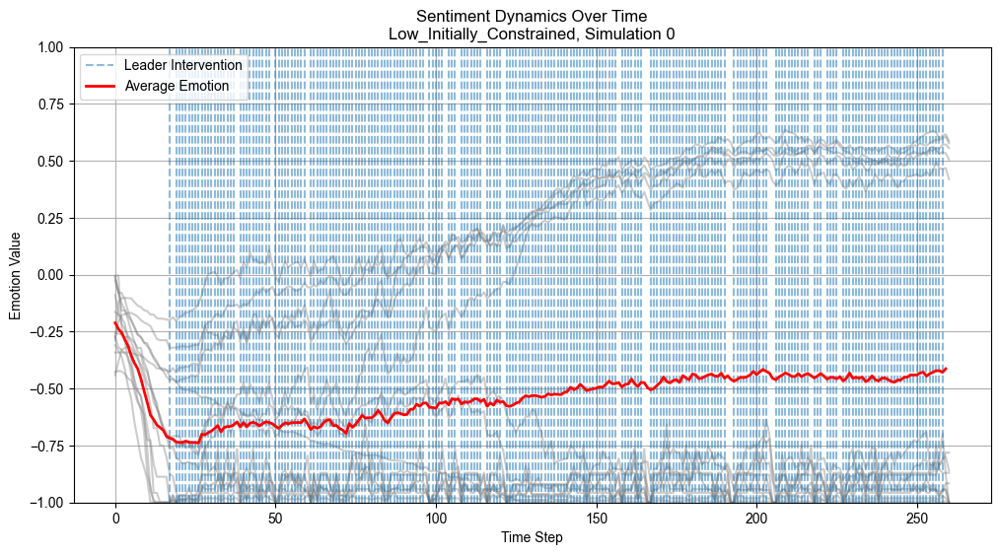

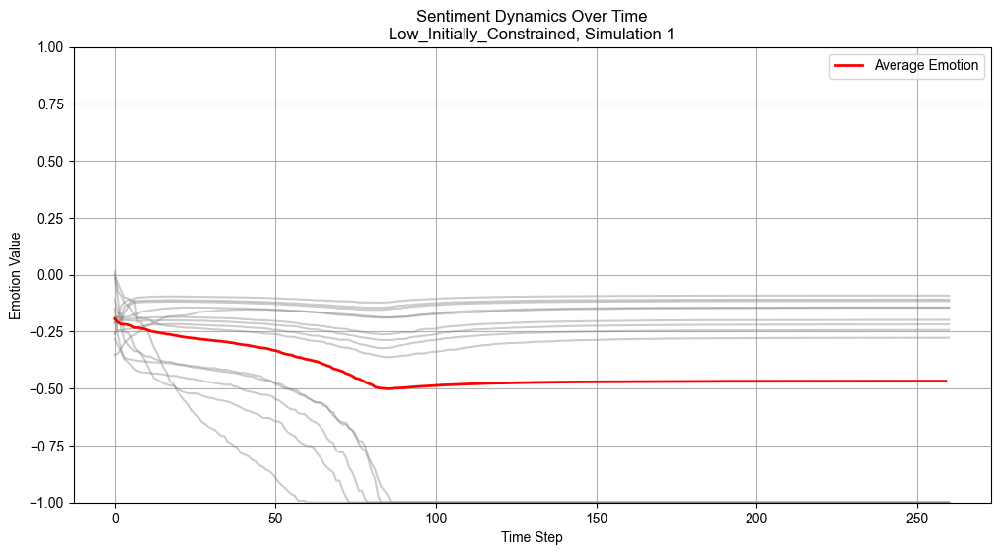

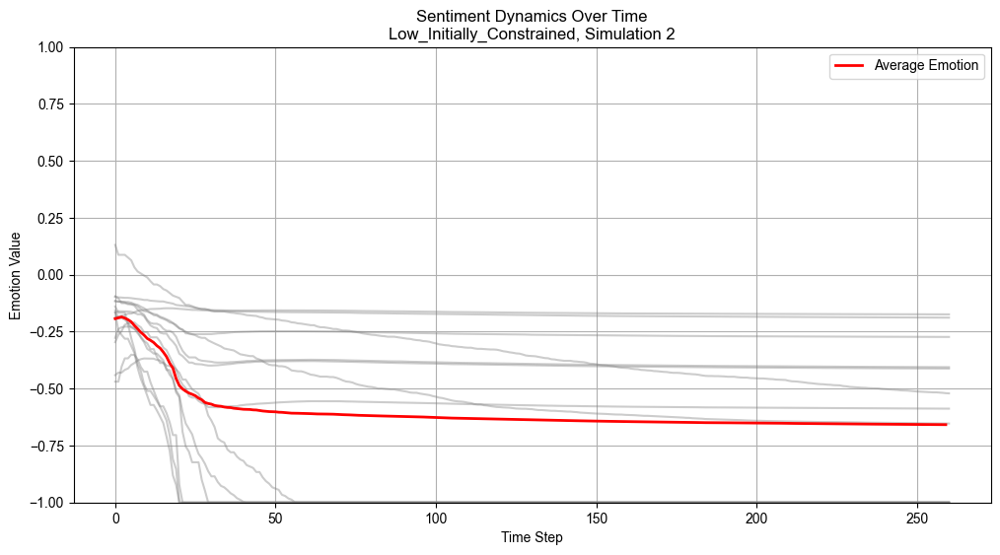

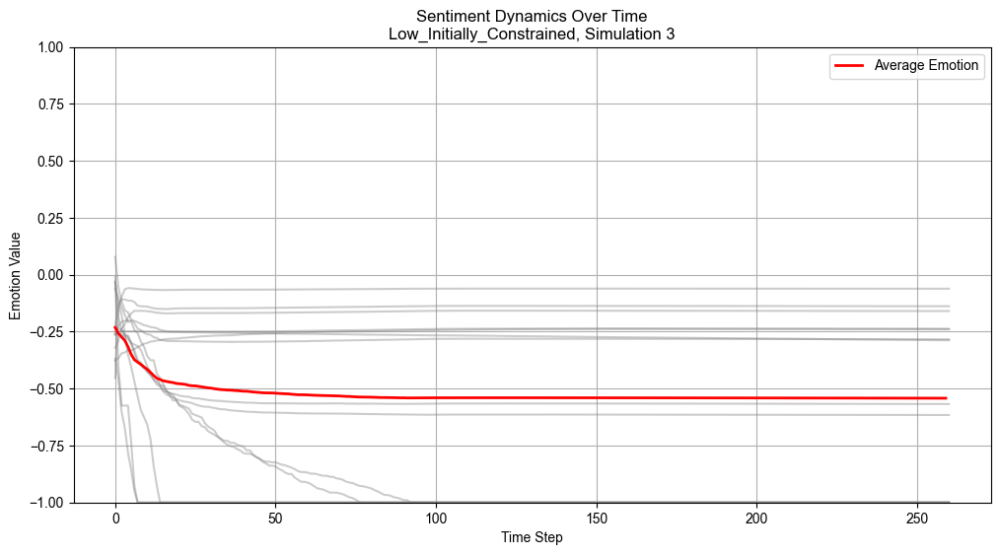

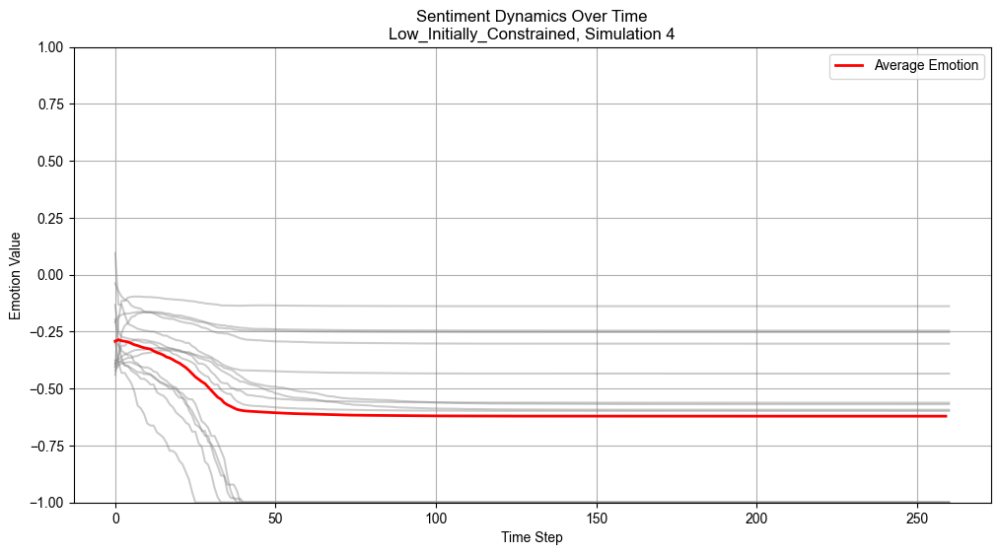

...

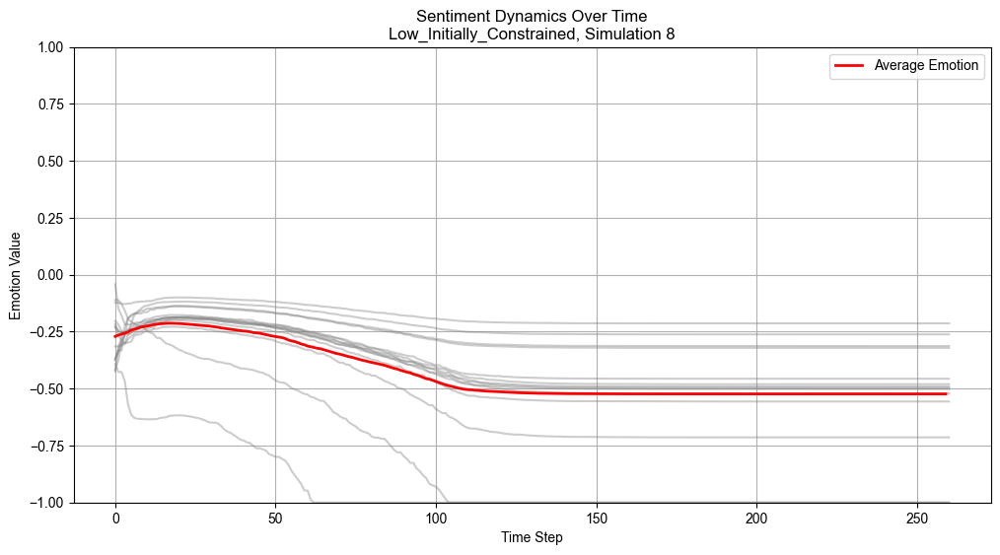

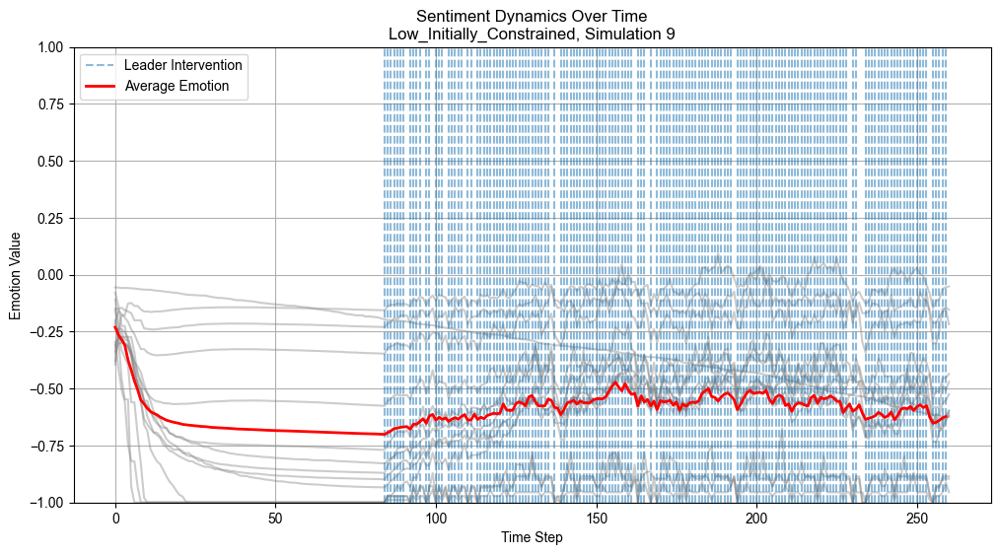

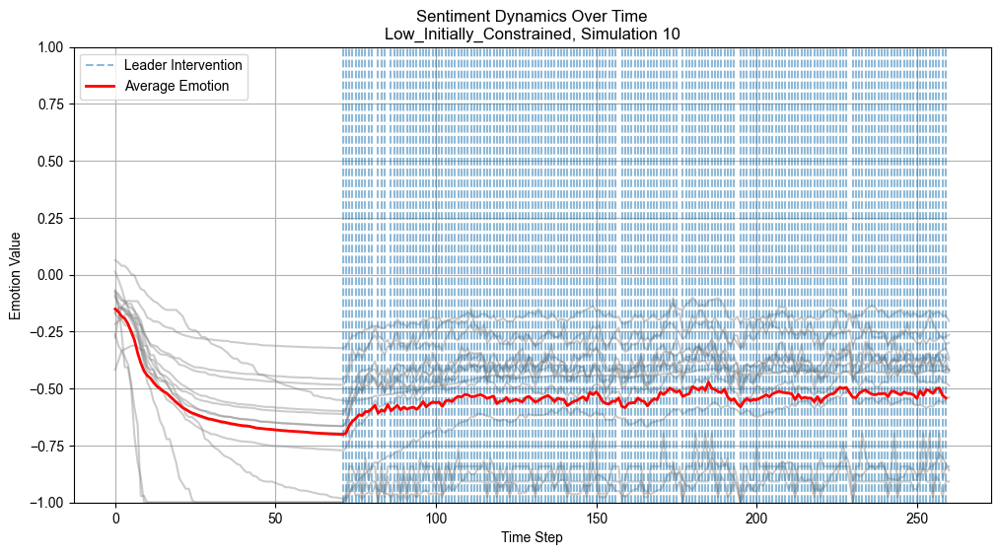

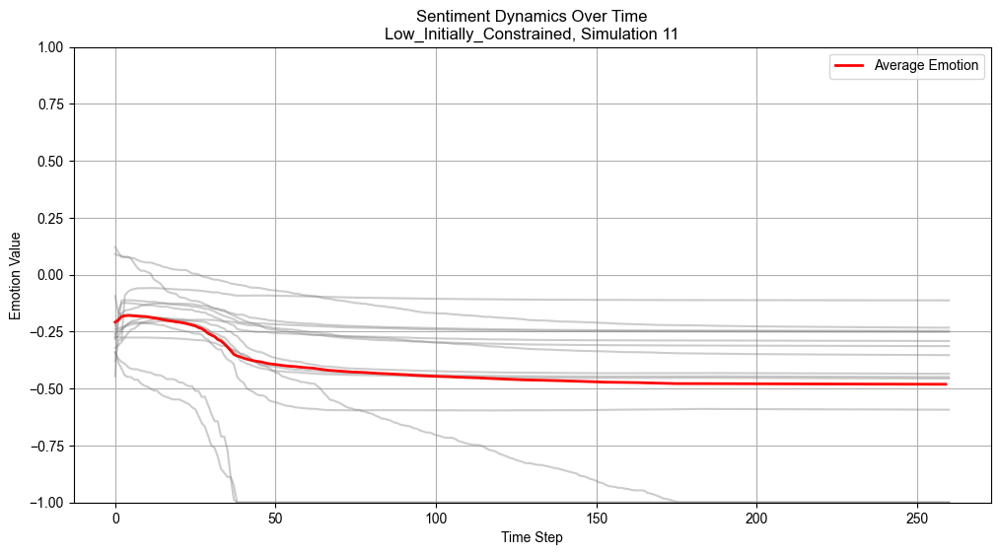

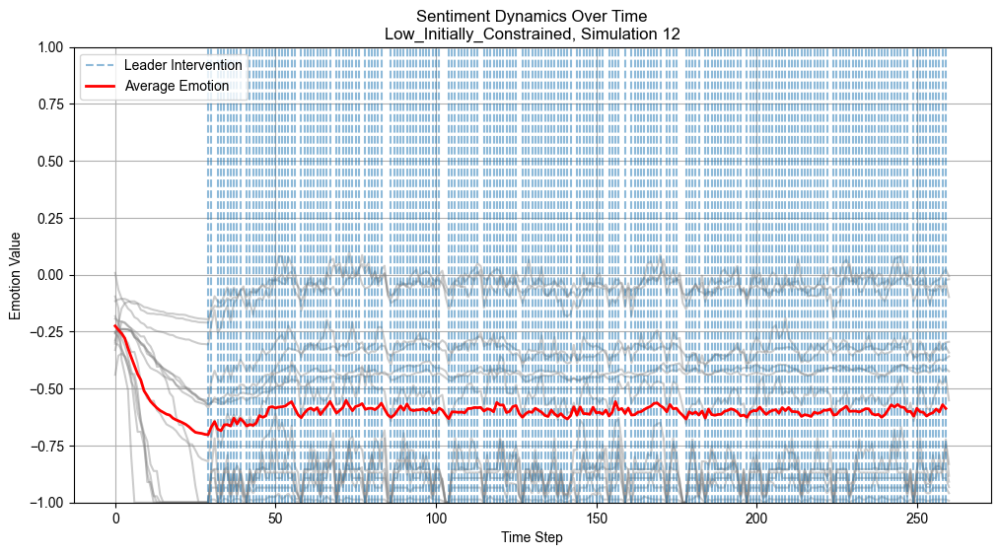

Showing sentiment graphs for Continuous


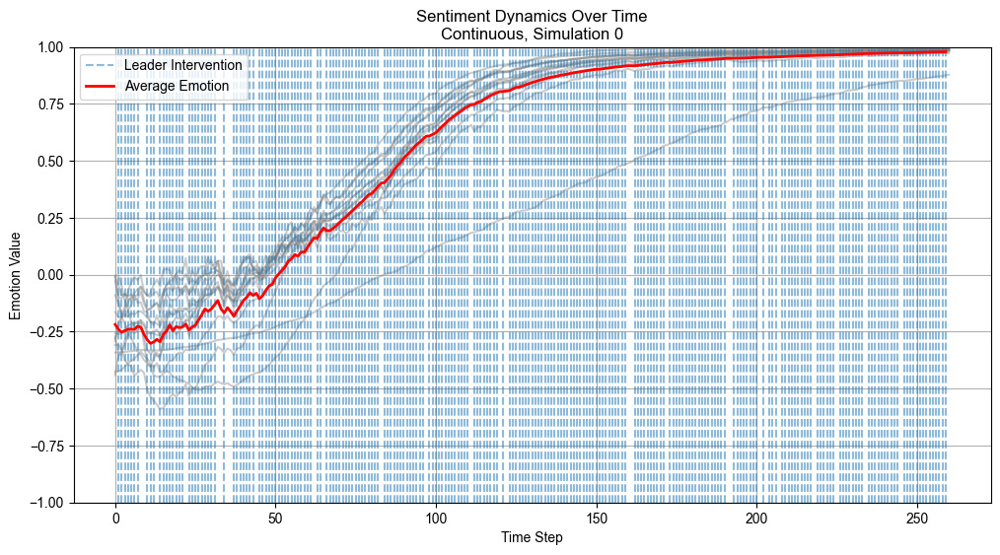

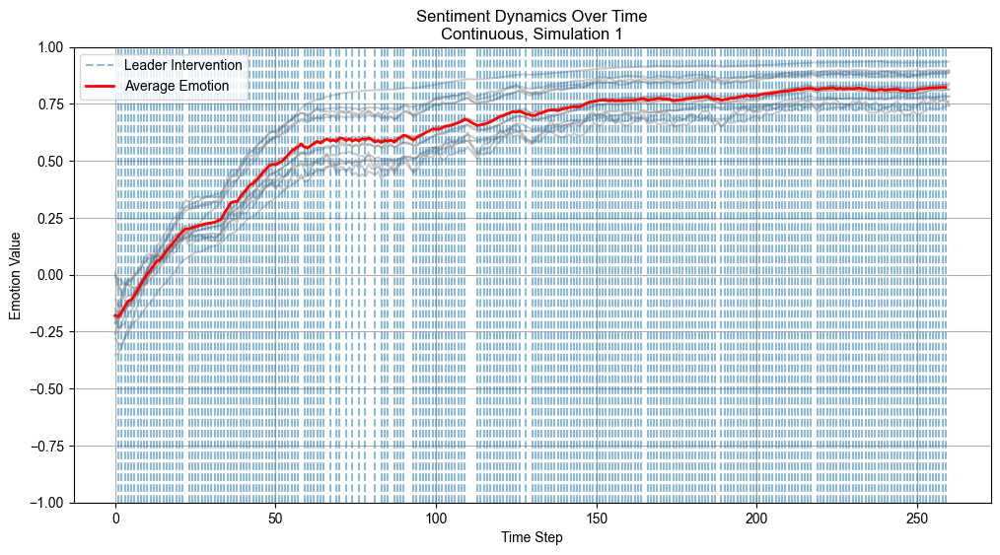

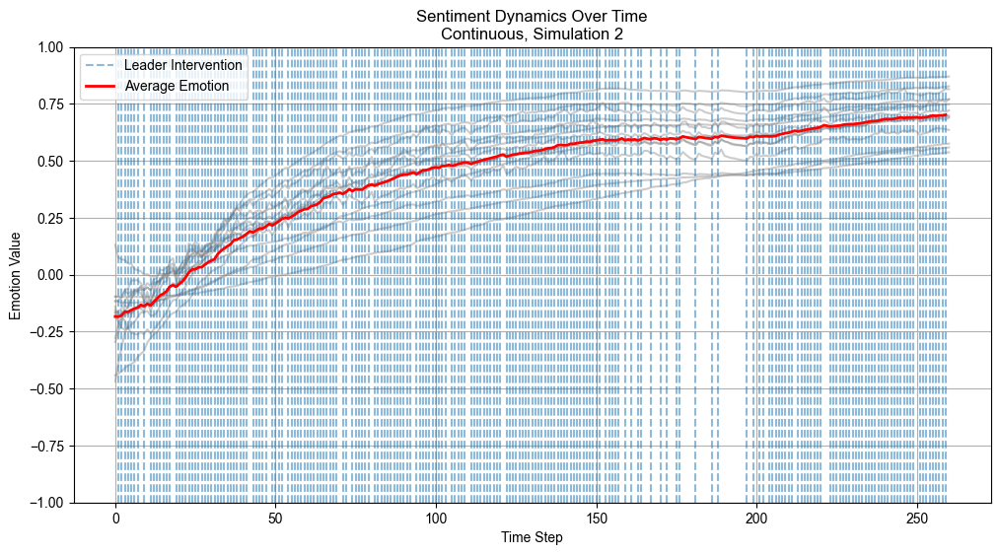

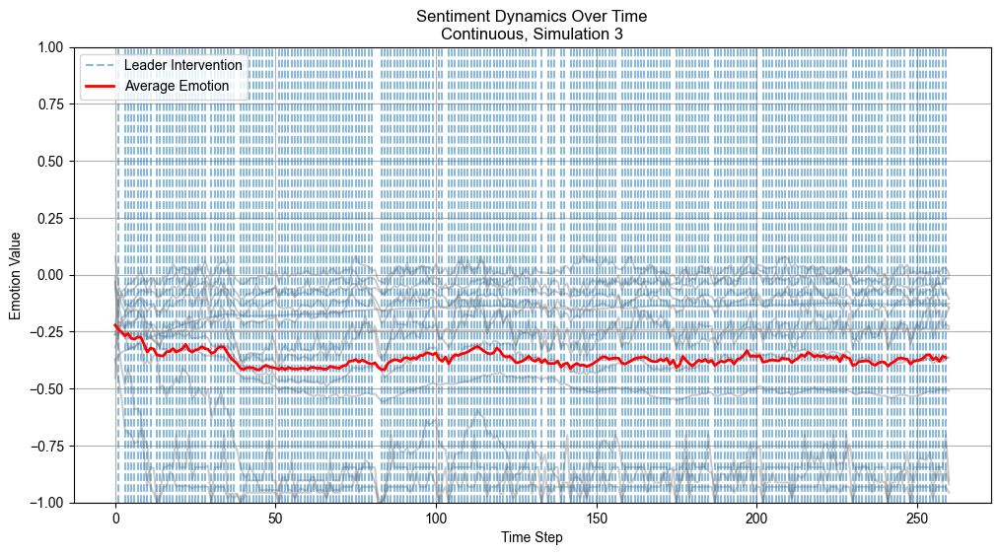

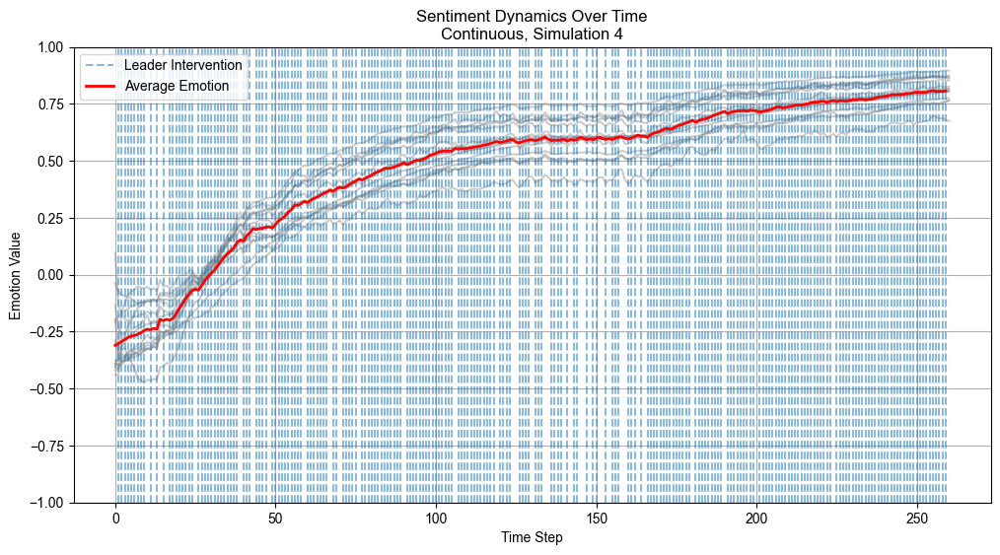

...

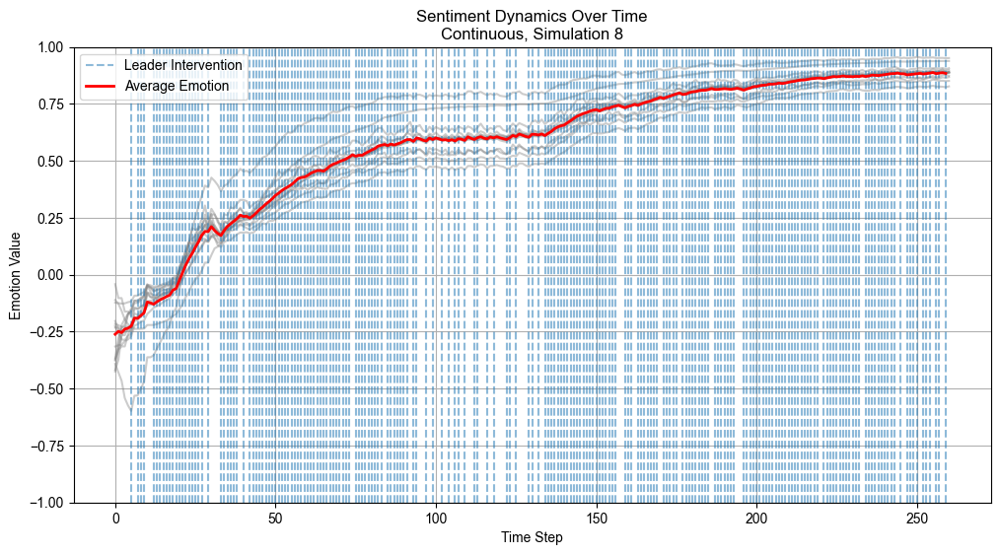

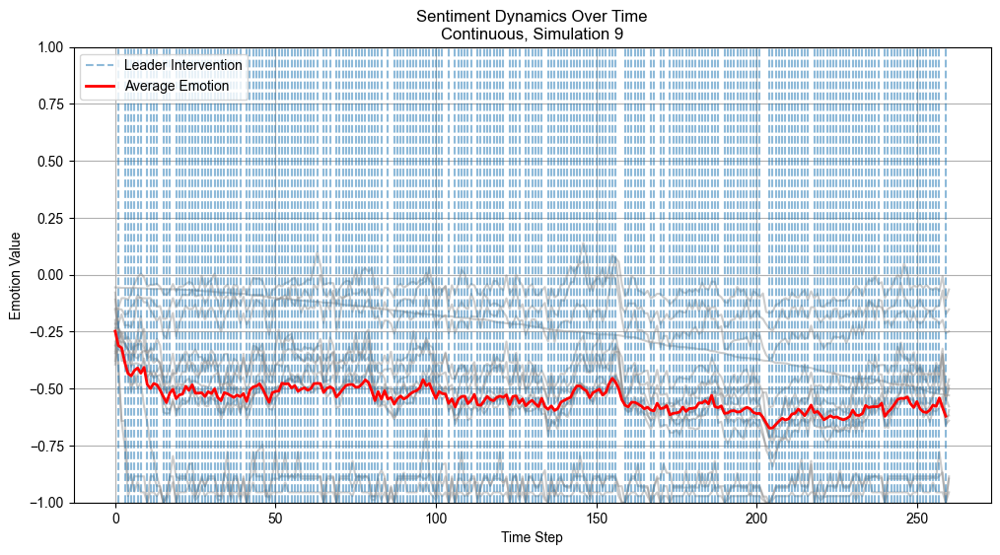

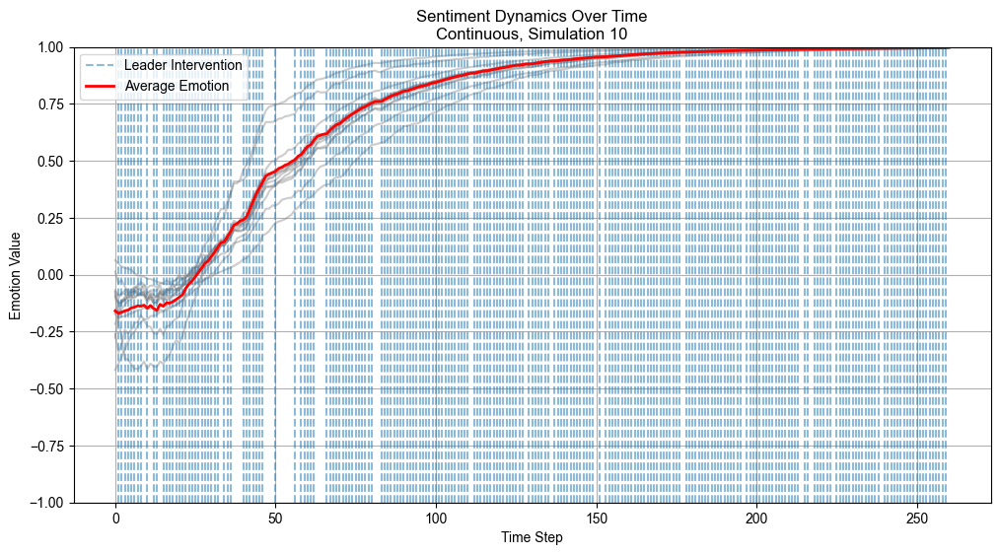

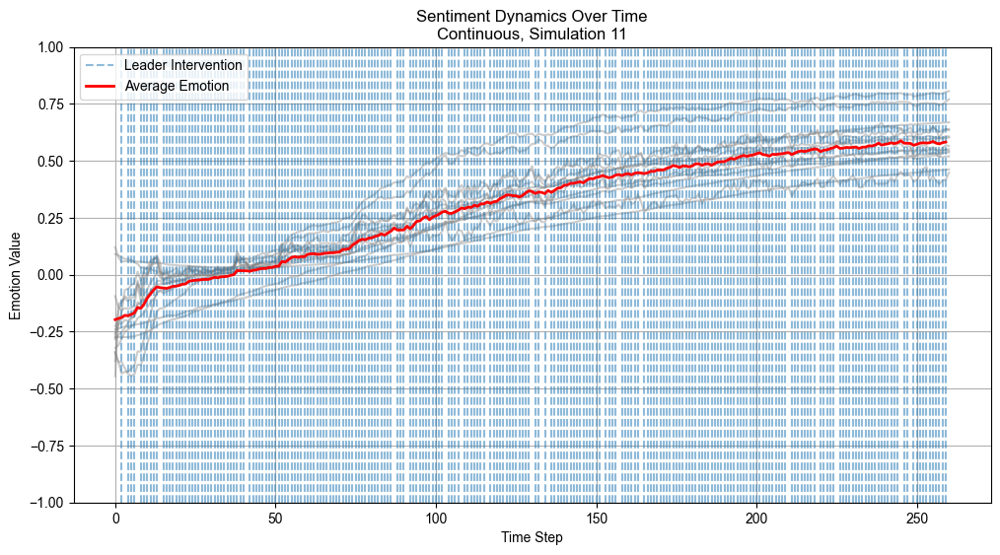

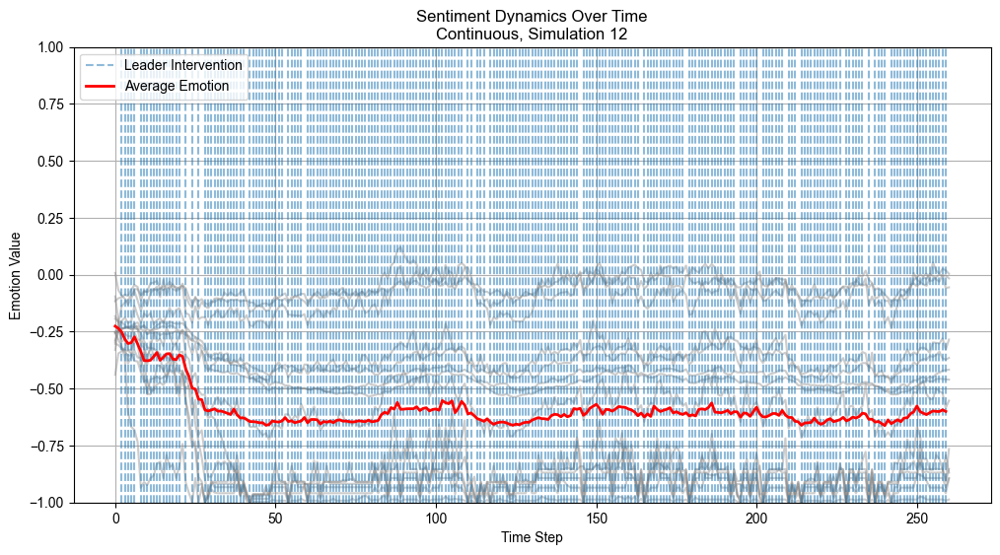

In [ ]:
parentfolder = Path(r"C:\Users\sarah\OneDrive\Documents\Masters\523\Emotion Contagion\Simulation Runs\RL")
#date_str = "12_01_2025"  # date.today().strftime("%m_%d_%Y")
base_folder = parentfolder / date_str / "random"

styles_to_include = ["No_Intervention", "High_Fully_Constrained", "Low_Fully_Constrained", "High_Initially_Constrained", "Low_Initially_Constrained", "Continuous"]  # ["High_Aperture", "Low_Aperture", "No_Intervention"]
for style in styles_to_include:
    with open(base_folder / style / "all_results.pkl", "rb") as f:
        res = pickle.load(f)
    
    print(f"Showing sentiment graphs for {style}")
    for fig in res.sentiment_graphs:
        fig.canvas.draw()
        display(fig)


from IPython.display import Image, display
import io

for i, fig in enumerate(res.sentiment_graphs):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight')
    buf.seek(0)
    display(Image(data=buf.read(), format='png'))